# Using a sequential Monte Carlo model to localize sensors based on radio pings: run calculations

## Load the libraries we need

Load the third-party libraries.

In [1]:
import numpy as np
from scipy import special
import pandas as pd
from sklearn import linear_model
import matplotlib.pyplot as plt
from matplotlib import patches
import math
import os

Load our `smclocalize` module.

In [2]:
from smclocalize import *

## Set the data directory

In [3]:
data_path = './data/'

In [4]:
data_run_directory = 'aster_180313/'

## Load the ping data

In [5]:
ping_data = np.load(
    os.path.join(data_path,
                 data_run_directory,
                 'numpy/ping_data.npz'))

In [6]:
child_entity_ids = ping_data['child_entity_ids']
material_entity_ids = ping_data['material_entity_ids']
teacher_entity_ids = ping_data['teacher_entity_ids']
area_entity_ids = ping_data['area_entity_ids']
timestamps = ping_data['timestamps']
num_timesteps = ping_data['num_timesteps']
y_discrete_t = ping_data['y_discrete_t']
y_continuous_t = ping_data['y_continuous_t']

## Define the variable structure for the model

Using the lists of entity IDs, define an instance of the `SensorVariableStructure` class. This class provides a whole bunch of variables and helper functions for working with the data.

In [7]:
variable_structure = SensorVariableStructure(child_entity_ids,
                                             material_entity_ids,
                                             teacher_entity_ids,
                                             area_entity_ids)

## Create the model

### Load the positions of fixed sensors

In [8]:
fixed_sensor_position_data = np.load(
    os.path.join(
        data_path,
        data_run_directory,
        'numpy/fixed_sensor_positions.npz'))

In [9]:
fixed_sensor_positions = fixed_sensor_position_data['fixed_sensor_positions']

In [10]:
fixed_sensor_positions

array([[ 4.2164,  0.    ],
       [12.1158,  5.2324],
       [12.9286,  2.54  ],
       [ 6.9342,  3.7338],
       [ 0.5842,  0.    ],
       [ 2.2098,  5.9436],
       [10.9982,  1.4986],
       [ 9.652 ,  0.1524],
       [ 3.3782,  3.4798]])

### Room geometry

In [11]:
room_size = np.array([15.35, 7.02])

In [12]:
fixed_sensor_positions.max(axis=0)

array([12.9286,  5.9436])

In [13]:
room_corners = np.array([[0.0, 0.0], room_size])

### Initialize the model object

Create a instance of the `SensorModel` class. This class (which is a child of the more general `SMCModel` class) provides functions which allow us to perform inference, generated simulated data, etc. It assumes particular functional forms for the initial state model, the state transition model, and the sensor response model. It does take arguments for various parameters of these models (see the code for the class), but below we use the defaults.

Set the number of particles.

In [14]:
num_particles = 10000

In [15]:
sensor_model = SensorModel(
    variable_structure,
    room_corners,
    fixed_sensor_positions,
    num_particles,
    ping_success_probability_zero_distance = 0.5655,
    receive_probability_reference_distance = 0.007941,
    rssi_untruncated_mean_intercept = -74.6121,
    rssi_untruncated_mean_slope = -8.6608,
    rssi_untruncated_std_dev = 4.570)

## Sample the posterior distribution $f(\mathbf{X}_t | \mathbf{Y}_0, \ldots, \mathbf{Y}_t)$ of the real data using a particle filter

Using the helper functions provided by the `SensorModel` class, generate samples of the posterior distribution (i.e., the distribution of $\mathbf{X}$ values given the observed $\mathbf{Y}$ values). Below, we separately generate the samples for each time step to mimic the real-time use case. There is also a helper function called `generate_particle_trajectory()` which generates an entire trajectory of $\mathbf{X}$ samples given an entire trajectory of $\mathbf{Y}$ values (not shown here).

In [16]:
t_test = timestamps
num_timesteps_test = len(t_test)

In [17]:
num_timesteps_test

511

Initialize the variables.

In [18]:
x_discrete_particles_trajectory = np.zeros(
    (num_timesteps_test, num_particles, variable_structure.num_x_discrete_vars),
    dtype = 'int')
x_continuous_particles_trajectory = np.zeros(
    (num_timesteps_test, num_particles, variable_structure.num_x_continuous_vars),
    dtype = 'float')
log_weights_trajectory = np.zeros(
    (num_timesteps_test, num_particles),
    dtype = 'float')
ancestor_indices_trajectory = np.zeros(
    (num_timesteps_test, num_particles),
    dtype = 'int')

In [19]:
x_discrete_particles_resampled_trajectory = np.zeros(
    (num_timesteps_test, num_particles, variable_structure.num_x_discrete_vars),
    dtype = 'int')
x_continuous_particles_resampled_trajectory = np.zeros(
    (num_timesteps_test, num_particles, variable_structure.num_x_continuous_vars),
    dtype = 'float')

Generate the particles for the initial state $\mathbf{X}_0$.

In [20]:
x_discrete_particles_trajectory[0], x_continuous_particles_trajectory[0], log_weights_trajectory[0] = sensor_model.generate_initial_particles(
    y_discrete_t[0],
    y_continuous_t[0])

Generate the particles for all later times.

In [21]:
log_weight_threshold = np.log(1/num_particles)
for t_index in range(1, num_timesteps_test):
    print('{}: {}'.format(t_index, t_test[t_index]))
    print('Number of non-negligible previous weights: {}'.format(np.sum(log_weights_trajectory[t_index - 1] > log_weight_threshold)))
    x_discrete_particles_trajectory[t_index], x_continuous_particles_trajectory[t_index], log_weights_trajectory[t_index], ancestor_indices_trajectory[t_index] = sensor_model.generate_next_particles(
        x_discrete_particles_trajectory[t_index - 1],
        x_continuous_particles_trajectory[t_index - 1],
        log_weights_trajectory[t_index - 1],
        y_discrete_t[t_index],
        y_continuous_t[t_index],
        t_test[t_index] - t_test[t_index - 1])
    print('Number of particles after resampling: {}'.format(len(np.unique(ancestor_indices_trajectory[t_index]))))

1: 2018-03-13T23:35:10.000000000
Number of non-negligible previous weights: 3
Number of particles after resampling: 3
2: 2018-03-13T23:35:20.000000000
Number of non-negligible previous weights: 2
Number of particles after resampling: 2
3: 2018-03-13T23:35:30.000000000
Number of non-negligible previous weights: 3
Number of particles after resampling: 5
4: 2018-03-13T23:35:40.000000000
Number of non-negligible previous weights: 3
Number of particles after resampling: 3
5: 2018-03-13T23:35:50.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 11
6: 2018-03-13T23:36:00.000000000
Number of non-negligible previous weights: 9
Number of particles after resampling: 9
7: 2018-03-13T23:36:10.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 9
8: 2018-03-13T23:36:20.000000000
Number of non-negligible previous weights: 4
Number of particles after resampling: 6
9: 2018-03-13T23:36:30.000000000
Number of non-negligib

Number of particles after resampling: 10
70: 2018-03-13T23:46:40.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 9
71: 2018-03-13T23:46:50.000000000
Number of non-negligible previous weights: 21
Number of particles after resampling: 23
72: 2018-03-13T23:47:00.000000000
Number of non-negligible previous weights: 2
Number of particles after resampling: 2
73: 2018-03-13T23:47:10.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 5
74: 2018-03-13T23:47:20.000000000
Number of non-negligible previous weights: 5
Number of particles after resampling: 6
75: 2018-03-13T23:47:30.000000000
Number of non-negligible previous weights: 7
Number of particles after resampling: 9
76: 2018-03-13T23:47:40.000000000
Number of non-negligible previous weights: 15
Number of particles after resampling: 17
77: 2018-03-13T23:47:50.000000000
Number of non-negligible previous weights: 3
Number of particles after resampling: 5
78:

Number of particles after resampling: 10
138: 2018-03-13T23:58:00.000000000
Number of non-negligible previous weights: 35
Number of particles after resampling: 42
139: 2018-03-13T23:58:10.000000000
Number of non-negligible previous weights: 22
Number of particles after resampling: 28
140: 2018-03-13T23:58:20.000000000
Number of non-negligible previous weights: 14
Number of particles after resampling: 26
141: 2018-03-13T23:58:30.000000000
Number of non-negligible previous weights: 10
Number of particles after resampling: 10
142: 2018-03-13T23:58:40.000000000
Number of non-negligible previous weights: 10
Number of particles after resampling: 11
143: 2018-03-13T23:58:50.000000000
Number of non-negligible previous weights: 18
Number of particles after resampling: 23
144: 2018-03-13T23:59:00.000000000
Number of non-negligible previous weights: 28
Number of particles after resampling: 30
145: 2018-03-13T23:59:10.000000000
Number of non-negligible previous weights: 5
Number of particles after

Number of particles after resampling: 15
206: 2018-03-14T00:09:20.000000000
Number of non-negligible previous weights: 7
Number of particles after resampling: 8
207: 2018-03-14T00:09:30.000000000
Number of non-negligible previous weights: 2
Number of particles after resampling: 2
208: 2018-03-14T00:09:40.000000000
Number of non-negligible previous weights: 13
Number of particles after resampling: 15
209: 2018-03-14T00:09:50.000000000
Number of non-negligible previous weights: 10
Number of particles after resampling: 12
210: 2018-03-14T00:10:00.000000000
Number of non-negligible previous weights: 10
Number of particles after resampling: 15
211: 2018-03-14T00:10:10.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 6
212: 2018-03-14T00:10:20.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 10
213: 2018-03-14T00:10:30.000000000
Number of non-negligible previous weights: 8
Number of particles after resamp

Number of particles after resampling: 9
274: 2018-03-14T00:20:40.000000000
Number of non-negligible previous weights: 11
Number of particles after resampling: 15
275: 2018-03-14T00:20:50.000000000
Number of non-negligible previous weights: 12
Number of particles after resampling: 15
276: 2018-03-14T00:21:00.000000000
Number of non-negligible previous weights: 2
Number of particles after resampling: 2
277: 2018-03-14T00:21:10.000000000
Number of non-negligible previous weights: 15
Number of particles after resampling: 17
278: 2018-03-14T00:21:20.000000000
Number of non-negligible previous weights: 8
Number of particles after resampling: 8
279: 2018-03-14T00:21:30.000000000
Number of non-negligible previous weights: 31
Number of particles after resampling: 31
280: 2018-03-14T00:21:40.000000000
Number of non-negligible previous weights: 5
Number of particles after resampling: 5
281: 2018-03-14T00:21:50.000000000
Number of non-negligible previous weights: 25
Number of particles after resam

Number of particles after resampling: 7
342: 2018-03-14T00:32:00.000000000
Number of non-negligible previous weights: 25
Number of particles after resampling: 26
343: 2018-03-14T00:32:10.000000000
Number of non-negligible previous weights: 7
Number of particles after resampling: 7
344: 2018-03-14T00:32:20.000000000
Number of non-negligible previous weights: 1
Number of particles after resampling: 1
345: 2018-03-14T00:32:30.000000000
Number of non-negligible previous weights: 6
Number of particles after resampling: 8
346: 2018-03-14T00:32:40.000000000
Number of non-negligible previous weights: 2
Number of particles after resampling: 2
347: 2018-03-14T00:32:50.000000000
Number of non-negligible previous weights: 10
Number of particles after resampling: 11
348: 2018-03-14T00:33:00.000000000
Number of non-negligible previous weights: 17
Number of particles after resampling: 19
349: 2018-03-14T00:33:10.000000000
Number of non-negligible previous weights: 15
Number of particles after resampl

Number of particles after resampling: 11
410: 2018-03-14T00:43:20.000000000
Number of non-negligible previous weights: 4
Number of particles after resampling: 6
411: 2018-03-14T00:43:30.000000000
Number of non-negligible previous weights: 11
Number of particles after resampling: 16
412: 2018-03-14T00:43:40.000000000
Number of non-negligible previous weights: 20
Number of particles after resampling: 30
413: 2018-03-14T00:43:50.000000000
Number of non-negligible previous weights: 3
Number of particles after resampling: 2
414: 2018-03-14T00:44:00.000000000
Number of non-negligible previous weights: 9
Number of particles after resampling: 13
415: 2018-03-14T00:44:10.000000000
Number of non-negligible previous weights: 7
Number of particles after resampling: 8
416: 2018-03-14T00:44:20.000000000
Number of non-negligible previous weights: 4
Number of particles after resampling: 6
417: 2018-03-14T00:44:30.000000000
Number of non-negligible previous weights: 13
Number of particles after resampl

Number of particles after resampling: 2
478: 2018-03-14T00:54:40.000000000
Number of non-negligible previous weights: 14
Number of particles after resampling: 17
479: 2018-03-14T00:54:50.000000000
Number of non-negligible previous weights: 3
Number of particles after resampling: 3
480: 2018-03-14T00:55:00.000000000
Number of non-negligible previous weights: 25
Number of particles after resampling: 29
481: 2018-03-14T00:55:10.000000000
Number of non-negligible previous weights: 14
Number of particles after resampling: 19
482: 2018-03-14T00:55:20.000000000
Number of non-negligible previous weights: 10
Number of particles after resampling: 11
483: 2018-03-14T00:55:30.000000000
Number of non-negligible previous weights: 14
Number of particles after resampling: 19
484: 2018-03-14T00:55:40.000000000
Number of non-negligible previous weights: 5
Number of particles after resampling: 6
485: 2018-03-14T00:55:50.000000000
Number of non-negligible previous weights: 3
Number of particles after resa

Run one timetep for profiling purposes.

In [22]:
t_index_profile = 10
print('{}: {}'.format(t_index_profile, t_test[t_index_profile]))
x_discrete_particles_profile, x_continuous_particles_profile, log_weights_profile, ancestor_indices_profile = sensor_model.generate_next_particles_profile(
    x_discrete_particles_trajectory[t_index_profile - 1],
    x_continuous_particles_trajectory[t_index_profile - 1],
    log_weights_trajectory[t_index_profile - 1],
    y_discrete_t[t_index_profile],
    y_continuous_t[t_index_profile],
    t_test[t_index_profile] - t_test[t_index_profile - 1],
    'output/aster_180313/tensorflow_log')

10: 2018-03-13T23:36:40.000000000


In [23]:
num_nonzero_weights = np.sum(np.isfinite(log_weights_trajectory), axis=-1)

In [24]:
num_nonnegligible_weights = np.sum(log_weights_trajectory > log_weight_threshold, axis=-1)

In [25]:
num_after_resampling = np.array(
    [len(np.unique(ancestor_indices_trajectory[t_index + 1])) for t_index in range(0, num_timesteps_test - 1)])

Calculate the sample means and sample standard deviations of the particles at each time step.

In [26]:
x_discrete_mean_particle = np.average(
    x_discrete_particles_trajectory, 
    axis=1, 
    weights=np.repeat(np.exp(log_weights_trajectory), variable_structure.num_x_discrete_vars).reshape(
        (num_timesteps_test,
         num_particles,
         variable_structure.num_x_discrete_vars)))

In [27]:
x_continuous_mean_particle = np.average(
    x_continuous_particles_trajectory, 
    axis=1, 
    weights=np.repeat(np.exp(log_weights_trajectory), variable_structure.num_x_continuous_vars).reshape(
        (num_timesteps_test,
         num_particles,
         variable_structure.num_x_continuous_vars)))

In [28]:
x_continuous_squared_mean_particle = np.average(
    np.square(x_continuous_particles_trajectory), 
    axis=1,
    weights=np.repeat(np.exp(log_weights_trajectory), variable_structure.num_x_continuous_vars).reshape(
        (num_timesteps_test,
         num_particles,
         variable_structure.num_x_continuous_vars)))

In [29]:
x_continuous_sd_particle = np.sqrt(np.abs(x_continuous_squared_mean_particle - np.square(x_continuous_mean_particle)))

In [30]:
for t_index in range(0, num_timesteps_test - 1):
    x_discrete_particles_resampled_trajectory[t_index] = x_discrete_particles_trajectory[t_index, ancestor_indices_trajectory[t_index + 1]]
    x_continuous_particles_resampled_trajectory[t_index] = x_continuous_particles_trajectory[t_index, ancestor_indices_trajectory[t_index + 1]]

## Generate simulated $\mathbf{X}$ and $\mathbf{Y}$ data

Now we want to run the same calculation, but with simulated sensor data. This allows us to see how accurately the model can infer positions when the conditional probability distributions of the actual data match the assumptions in the model exactly.

Set the number of timesteps and initialize the variables.

In [31]:
start_time_sim = np.datetime64("2017-01-01T09:00")
time_delta_sim = np.timedelta64(10, 's')
num_timesteps_sim = len(timestamps)
t_sim = np.arange(start_time_sim, start_time_sim + num_timesteps_sim*time_delta_sim, time_delta_sim)

In [32]:
x_discrete_t_sim, x_continuous_t_sim, y_discrete_t_sim, y_continuous_t_sim = sensor_model.generate_simulation_trajectory(t_sim)

## Sample the posterior distribution $f(\mathbf{X}_t | \mathbf{Y}_0, \ldots, \mathbf{Y}_t)$ of the simulated data using a particle filter

Initialize variables.

In [33]:
x_discrete_particles_trajectory_sim = np.zeros(
    (num_timesteps_sim, num_particles, variable_structure.num_x_discrete_vars),
    dtype = 'int')
x_continuous_particles_trajectory_sim = np.zeros(
    (num_timesteps_sim, num_particles, variable_structure.num_x_continuous_vars),
    dtype = 'float')
log_weights_trajectory_sim = np.zeros(
    (num_timesteps_sim, num_particles),
    dtype = 'float')
ancestor_indices_trajectory_sim = np.zeros(
    (num_timesteps_sim, num_particles),
    dtype = 'int')

In [34]:
x_discrete_particles_resampled_trajectory_sim = np.zeros(
    (num_timesteps_sim, num_particles, variable_structure.num_x_discrete_vars),
    dtype = 'int')
x_continuous_particles_resampled_trajectory_sim = np.zeros(
    (num_timesteps_sim, num_particles, variable_structure.num_x_continuous_vars),
    dtype = 'float')

Generate the particles for the initial state $\mathbf{X}_0$.

In [35]:
x_discrete_particles_trajectory_sim[0], x_continuous_particles_trajectory_sim[0], log_weights_trajectory_sim[0] = sensor_model.generate_initial_particles(
    y_discrete_t_sim[0],
    y_continuous_t_sim[0])

Calculate the particles for all later times.

In [36]:
log_weight_threshold = np.log(1/num_particles)
for t_index in range(1, num_timesteps_sim):
    print('{}: {}'.format(t_index, t_sim[t_index]))
    print('Number of non-negligible previous weights: {}'.format(np.sum(log_weights_trajectory_sim[t_index - 1] > log_weight_threshold)))
    x_discrete_particles_trajectory_sim[t_index], x_continuous_particles_trajectory_sim[t_index], log_weights_trajectory_sim[t_index], ancestor_indices_trajectory_sim[t_index] = sensor_model.generate_next_particles(
        x_discrete_particles_trajectory_sim[t_index - 1],
        x_continuous_particles_trajectory_sim[t_index - 1],
        log_weights_trajectory_sim[t_index - 1],
        y_discrete_t_sim[t_index],
        y_continuous_t_sim[t_index],
        t_sim[t_index] - t_sim[t_index - 1])
    print('Number of particles after resampling: {}'.format(len(np.unique(ancestor_indices_trajectory_sim[t_index]))))

1: 2017-01-01T09:00:10
Number of non-negligible previous weights: 14
Number of particles after resampling: 21
2: 2017-01-01T09:00:20
Number of non-negligible previous weights: 84
Number of particles after resampling: 122
3: 2017-01-01T09:00:30
Number of non-negligible previous weights: 27
Number of particles after resampling: 52
4: 2017-01-01T09:00:40
Number of non-negligible previous weights: 39
Number of particles after resampling: 51
5: 2017-01-01T09:00:50
Number of non-negligible previous weights: 110
Number of particles after resampling: 173
6: 2017-01-01T09:01:00
Number of non-negligible previous weights: 30
Number of particles after resampling: 42
7: 2017-01-01T09:01:10
Number of non-negligible previous weights: 319
Number of particles after resampling: 411
8: 2017-01-01T09:01:20
Number of non-negligible previous weights: 138
Number of particles after resampling: 224
9: 2017-01-01T09:01:30
Number of non-negligible previous weights: 204
Number of particles after resampling: 341
1

Number of particles after resampling: 1322
75: 2017-01-01T09:12:30
Number of non-negligible previous weights: 1047
Number of particles after resampling: 1605
76: 2017-01-01T09:12:40
Number of non-negligible previous weights: 1208
Number of particles after resampling: 1877
77: 2017-01-01T09:12:50
Number of non-negligible previous weights: 854
Number of particles after resampling: 1322
78: 2017-01-01T09:13:00
Number of non-negligible previous weights: 1003
Number of particles after resampling: 1469
79: 2017-01-01T09:13:10
Number of non-negligible previous weights: 34
Number of particles after resampling: 35
80: 2017-01-01T09:13:20
Number of non-negligible previous weights: 943
Number of particles after resampling: 1672
81: 2017-01-01T09:13:30
Number of non-negligible previous weights: 1253
Number of particles after resampling: 1978
82: 2017-01-01T09:13:40
Number of non-negligible previous weights: 18
Number of particles after resampling: 28
83: 2017-01-01T09:13:50
Number of non-negligibl

Number of particles after resampling: 14
147: 2017-01-01T09:24:30
Number of non-negligible previous weights: 1132
Number of particles after resampling: 1695
148: 2017-01-01T09:24:40
Number of non-negligible previous weights: 632
Number of particles after resampling: 976
149: 2017-01-01T09:24:50
Number of non-negligible previous weights: 8
Number of particles after resampling: 10
150: 2017-01-01T09:25:00
Number of non-negligible previous weights: 733
Number of particles after resampling: 1184
151: 2017-01-01T09:25:10
Number of non-negligible previous weights: 533
Number of particles after resampling: 826
152: 2017-01-01T09:25:20
Number of non-negligible previous weights: 16
Number of particles after resampling: 16
153: 2017-01-01T09:25:30
Number of non-negligible previous weights: 31
Number of particles after resampling: 41
154: 2017-01-01T09:25:40
Number of non-negligible previous weights: 65
Number of particles after resampling: 91
155: 2017-01-01T09:25:50
Number of non-negligible pre

Number of particles after resampling: 1276
219: 2017-01-01T09:36:30
Number of non-negligible previous weights: 336
Number of particles after resampling: 458
220: 2017-01-01T09:36:40
Number of non-negligible previous weights: 1158
Number of particles after resampling: 1667
221: 2017-01-01T09:36:50
Number of non-negligible previous weights: 1085
Number of particles after resampling: 1707
222: 2017-01-01T09:37:00
Number of non-negligible previous weights: 820
Number of particles after resampling: 1140
223: 2017-01-01T09:37:10
Number of non-negligible previous weights: 1458
Number of particles after resampling: 2198
224: 2017-01-01T09:37:20
Number of non-negligible previous weights: 15
Number of particles after resampling: 16
225: 2017-01-01T09:37:30
Number of non-negligible previous weights: 1634
Number of particles after resampling: 2241
226: 2017-01-01T09:37:40
Number of non-negligible previous weights: 845
Number of particles after resampling: 1234
227: 2017-01-01T09:37:50
Number of no

Number of particles after resampling: 2656
290: 2017-01-01T09:48:20
Number of non-negligible previous weights: 2496
Number of particles after resampling: 3763
291: 2017-01-01T09:48:30
Number of non-negligible previous weights: 576
Number of particles after resampling: 1002
292: 2017-01-01T09:48:40
Number of non-negligible previous weights: 328
Number of particles after resampling: 364
293: 2017-01-01T09:48:50
Number of non-negligible previous weights: 731
Number of particles after resampling: 896
294: 2017-01-01T09:49:00
Number of non-negligible previous weights: 2009
Number of particles after resampling: 3009
295: 2017-01-01T09:49:10
Number of non-negligible previous weights: 293
Number of particles after resampling: 628
296: 2017-01-01T09:49:20
Number of non-negligible previous weights: 2408
Number of particles after resampling: 3525
297: 2017-01-01T09:49:30
Number of non-negligible previous weights: 1653
Number of particles after resampling: 2299
298: 2017-01-01T09:49:40
Number of n

Number of particles after resampling: 2844
362: 2017-01-01T10:00:20
Number of non-negligible previous weights: 263
Number of particles after resampling: 471
363: 2017-01-01T10:00:30
Number of non-negligible previous weights: 265
Number of particles after resampling: 369
364: 2017-01-01T10:00:40
Number of non-negligible previous weights: 658
Number of particles after resampling: 1076
365: 2017-01-01T10:00:50
Number of non-negligible previous weights: 833
Number of particles after resampling: 1605
366: 2017-01-01T10:01:00
Number of non-negligible previous weights: 584
Number of particles after resampling: 846
367: 2017-01-01T10:01:10
Number of non-negligible previous weights: 733
Number of particles after resampling: 1088
368: 2017-01-01T10:01:20
Number of non-negligible previous weights: 313
Number of particles after resampling: 464
369: 2017-01-01T10:01:30
Number of non-negligible previous weights: 383
Number of particles after resampling: 599
370: 2017-01-01T10:01:40
Number of non-neg

Number of particles after resampling: 832
434: 2017-01-01T10:12:20
Number of non-negligible previous weights: 218
Number of particles after resampling: 300
435: 2017-01-01T10:12:30
Number of non-negligible previous weights: 48
Number of particles after resampling: 88
436: 2017-01-01T10:12:40
Number of non-negligible previous weights: 1463
Number of particles after resampling: 2390
437: 2017-01-01T10:12:50
Number of non-negligible previous weights: 275
Number of particles after resampling: 392
438: 2017-01-01T10:13:00
Number of non-negligible previous weights: 198
Number of particles after resampling: 271
439: 2017-01-01T10:13:10
Number of non-negligible previous weights: 573
Number of particles after resampling: 833
440: 2017-01-01T10:13:20
Number of non-negligible previous weights: 570
Number of particles after resampling: 838
441: 2017-01-01T10:13:30
Number of non-negligible previous weights: 319
Number of particles after resampling: 509
442: 2017-01-01T10:13:40
Number of non-negligi

Number of particles after resampling: 573
506: 2017-01-01T10:24:20
Number of non-negligible previous weights: 849
Number of particles after resampling: 1349
507: 2017-01-01T10:24:30
Number of non-negligible previous weights: 754
Number of particles after resampling: 1204
508: 2017-01-01T10:24:40
Number of non-negligible previous weights: 1543
Number of particles after resampling: 2282
509: 2017-01-01T10:24:50
Number of non-negligible previous weights: 1095
Number of particles after resampling: 1609
510: 2017-01-01T10:25:00
Number of non-negligible previous weights: 1394
Number of particles after resampling: 2085


Calculate the number of particles actually sampled at each time step.

In [37]:
num_nonzero_weights_sim = np.sum(np.isfinite(log_weights_trajectory_sim), axis=-1)

In [38]:
num_nonnegligible_weights_sim = np.sum(log_weights_trajectory_sim > log_weight_threshold, axis=-1)

In [39]:
num_after_resampling_sim = np.array([len(np.unique(ancestor_indices_trajectory_sim[t_index + 1])) for t_index in range(0, num_timesteps_test - 1)])

Calculate the sample means and sample standard deviations of the particles at each time step.

In [40]:
x_discrete_mean_particle_sim = np.average(
    x_discrete_particles_trajectory_sim, 
    axis=1, 
    weights=np.repeat(np.exp(log_weights_trajectory_sim), variable_structure.num_x_discrete_vars).reshape(
        (num_timesteps_sim,
         num_particles,
         variable_structure.num_x_discrete_vars)))

In [41]:
x_continuous_mean_particle_sim = np.average(
    x_continuous_particles_trajectory_sim, 
    axis=1, 
    weights=np.repeat(np.exp(log_weights_trajectory_sim), variable_structure.num_x_continuous_vars).reshape(
        (num_timesteps_sim,
         num_particles,
         variable_structure.num_x_continuous_vars)))

In [42]:
x_continuous_squared_mean_particle_sim = np.average(
    np.square(x_continuous_particles_trajectory_sim), 
    axis=1,
    weights=np.repeat(np.exp(log_weights_trajectory_sim), variable_structure.num_x_continuous_vars).reshape(
        (num_timesteps_sim,
         num_particles,
         variable_structure.num_x_continuous_vars)))

In [43]:
x_continuous_sd_particle_sim = np.sqrt(np.abs(x_continuous_squared_mean_particle_sim - np.square(x_continuous_mean_particle_sim)))

In [44]:
for t_index in range(0, num_timesteps_sim - 1):
    x_discrete_particles_resampled_trajectory_sim[t_index] = x_discrete_particles_trajectory_sim[t_index, ancestor_indices_trajectory_sim[t_index + 1]]
    x_continuous_particles_resampled_trajectory_sim[t_index] = x_continuous_particles_trajectory_sim[t_index, ancestor_indices_trajectory_sim[t_index + 1]]

## Explore and visualize the ping data

### Ping success rate

First, we calculate the ping success rate for each pair of sensors.

In [45]:
ping_success_rate = pd.DataFrame.from_items([
    ('y_discrete_name', variable_structure.y_discrete_names),
    ('success_rate', np.sum(y_discrete_t == 0, axis=0)/float(num_timesteps))
])

In [46]:
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', 500)
ping_success_rate

,y_discrete_name,success_rate
0,Status of ping from Child sensor 28348 to Child sensor 28352,0.772994
1,Status of ping from Child sensor 28348 to Child sensor 28354,0.365949
2,Status of ping from Child sensor 28348 to Child sensor 30007,0.015656
3,Status of ping from Child sensor 28348 to Child sensor 36212,0.168297
4,Status of ping from Child sensor 28348 to Child sensor 37757,0.007828
5,Status of ping from Child sensor 28348 to Child sensor 37758,0.086106
6,Status of ping from Child sensor 28348 to Child sensor 37760,0.013699
7,Status of ping from Child sensor 28348 to Child sensor 38394,0.037182
8,Status of ping from Child sensor 28348 to Child sensor 55514,0.475538
9,Status of ping from Child sensor 28348 to Child sensor 57651,0.000000


In [47]:
ping_success_rate['success_rate'].median()

0.0273972602739726

Plot a histogram.

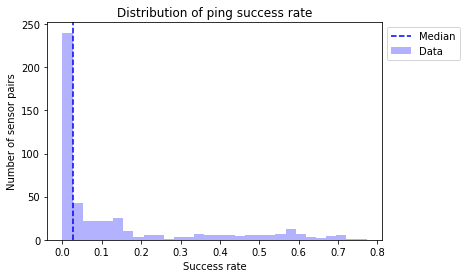

In [48]:
plt.hist(
    ping_success_rate['success_rate'],
    bins=30,
    facecolor='blue',
    alpha=0.3,
    label='Data')
plt.axvline(
    ping_success_rate['success_rate'].median(),
    linestyle='dashed',
    color='blue',
    label='Median')
plt.xlabel('Success rate')
plt.ylabel('Number of sensor pairs')
plt.title('Distribution of ping success rate')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

### Signal strength

Now we want to look at the distribution of measured RSSI values, but we need to take care to remove the zero values where no ping was received.

In [49]:
measured_rssi_values = y_continuous_t[y_continuous_t != 0.0]

Calculate the median observed RSSI value.

In [50]:
np.median(measured_rssi_values)

-75.0

Plot a histogram.

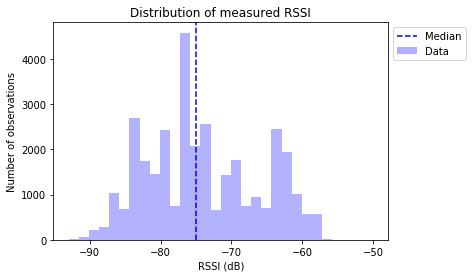

In [51]:
plt.hist(
    measured_rssi_values,
    bins=30,
    facecolor='blue',
    alpha=0.3,
    label='Data')
plt.axvline(
    np.median(measured_rssi_values),
    linestyle='dashed',
    color='blue',
    label='Median')
plt.xlabel('RSSI (dB)')
plt.ylabel('Number of observations')
plt.title('Distribution of measured RSSI')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

## Explore and visualize model inputs

Generate 1,000 samples of `x_initial_sample()` and check that they have the properties we expect.

In [52]:
x_discrete_initial_samples, x_continuous_initial_samples = sensor_model.x_initial_sample_test(1000)

In [53]:
pd.DataFrame.from_items([
    ('sensor_name', variable_structure.sensor_names),
    ('sensors_on_fraction', 1 - np.sum(x_discrete_initial_samples, axis = 0)/1000),
    ('sensors_off_fraction', np.sum(x_discrete_initial_samples, axis = 0)/1000)
])

,sensor_name,sensors_on_fraction,sensors_off_fraction
0,Child sensor 28348,0.885,0.115
1,Child sensor 28352,0.914,0.086
2,Child sensor 28354,0.880,0.120
3,Child sensor 30007,0.905,0.095
4,Child sensor 36212,0.898,0.102
5,Child sensor 37757,0.902,0.098
6,Child sensor 37758,0.904,0.096
7,Child sensor 37760,0.893,0.107
8,Child sensor 38394,0.902,0.098
9,Child sensor 55514,0.902,0.098


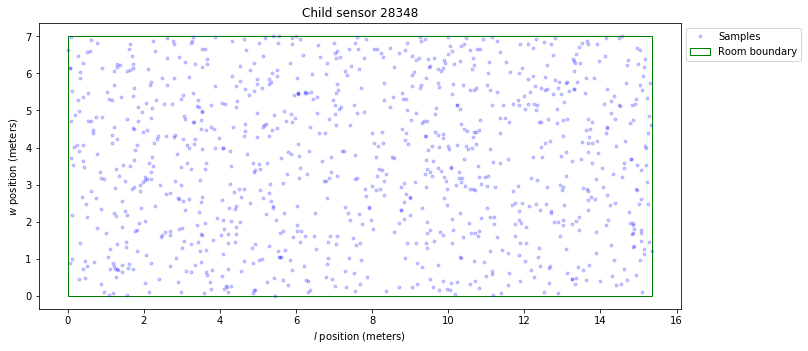

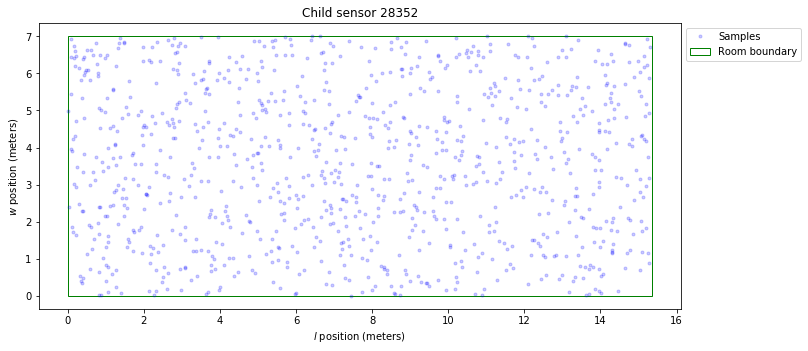

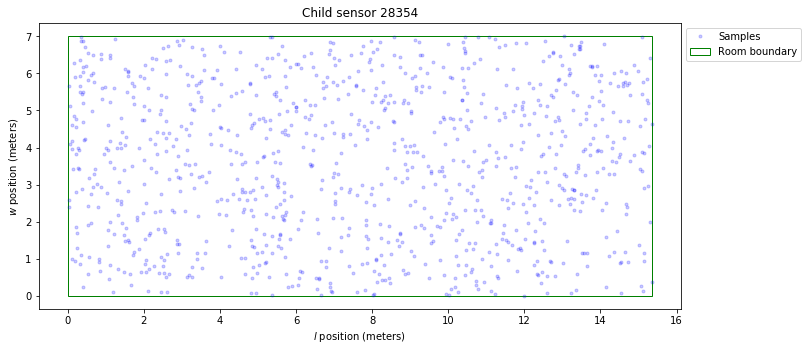

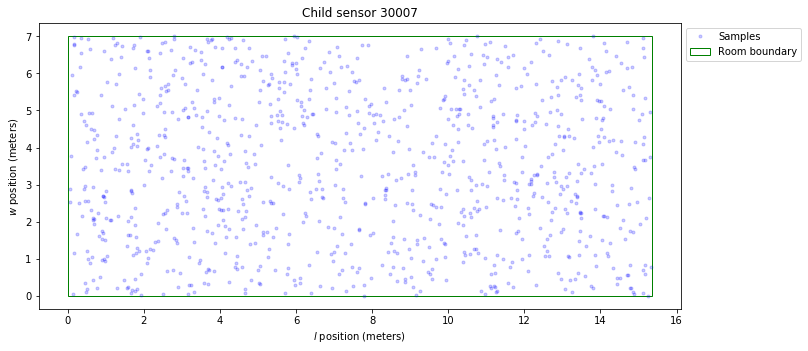

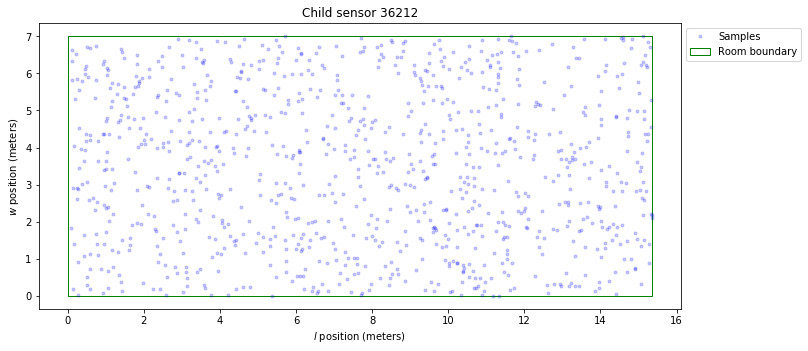

...

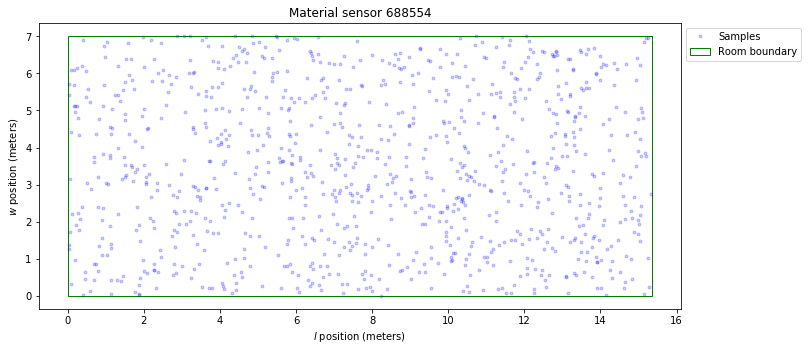

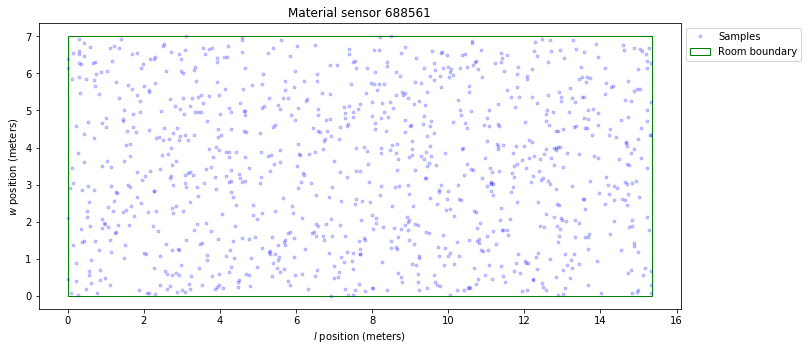

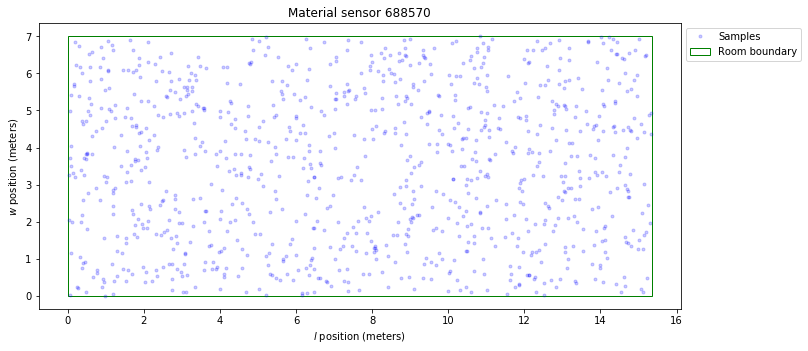

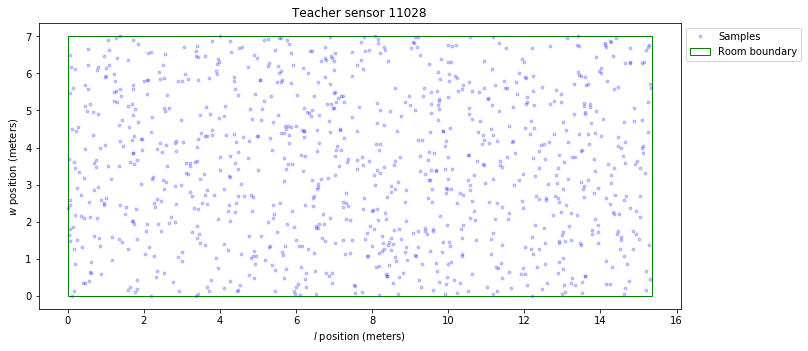

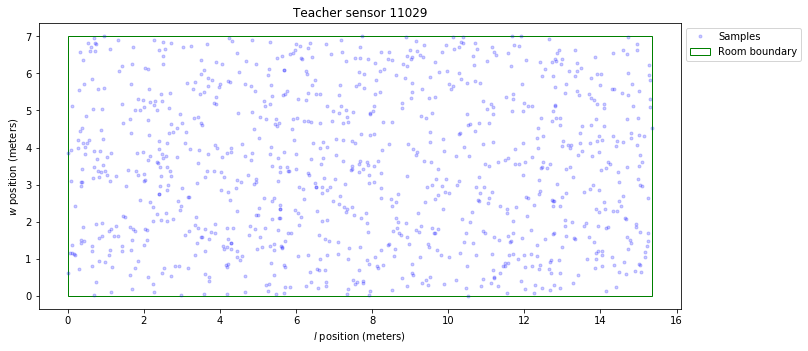

In [54]:
plt.rcParams["figure.figsize"] = room_size*0.75
for sensor_index in range(variable_structure.num_moving_sensors):
    plt.plot(
        x_continuous_initial_samples[:,sensor_index*2],
        x_continuous_initial_samples[:,sensor_index*2 + 1],
        'b.',
        alpha = 0.2,
        label="Samples")
    plt.title(variable_structure.sensor_names[sensor_index])
    plt.xlabel('{} position (meters)'.format(variable_structure.dimension_names[0]))
    plt.ylabel('{} position (meters)'.format(variable_structure.dimension_names[1]))
    ax=plt.gca()
    ax.add_patch(
        patches.Rectangle(
            (0,0),
            room_size[0],
            room_size[1],
            fill=False,
            color='green',
            label='Room boundary'))
    plt.xlim(0 - 0.05*room_size[0], room_size[0] + 0.05*room_size[0])
    plt.ylim(0 - 0.05*room_size[1], room_size[1] + 0.05*room_size[1])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault['figure.figsize']

Choose an arbitrary test value for $\mathbf{X}$, drawn from the initial distribution, that we can use to test the various functions below.

In [55]:
test_x_discrete_value, test_x_continuous_value = sensor_model.x_initial_sample_test()

Generate 1,000 samples from `x_bar_x_previous_sample()` (using our test value for $\mathbf{X}_{t-1}$) to make sure they have the properties we expect.

In [56]:
x_discrete_bar_x_previous_samples, x_continuous_bar_x_previous_samples = sensor_model.x_bar_x_previous_sample_test(
    np.tile(test_x_discrete_value, (1000,1)),
    np.tile(test_x_continuous_value, (1000,1)),
    np.timedelta64(10, 's'))

In [57]:
pd.DataFrame.from_items([
    ('sensor_name', variable_structure.sensor_names),
    ('sensor_on_previous', 1 - test_x_discrete_value),
    ('sensors_on_fraction', 1 - np.sum(x_discrete_bar_x_previous_samples, axis = 0)/1000),
    ('sensors_off_fraction', np.sum(x_discrete_bar_x_previous_samples, axis = 0)/1000)
])

,sensor_name,sensor_on_previous,sensors_on_fraction,sensors_off_fraction
0,Child sensor 28348,1,0.989,0.011
1,Child sensor 28352,1,0.985,0.015
2,Child sensor 28354,1,0.995,0.005
3,Child sensor 30007,1,0.991,0.009
4,Child sensor 36212,1,0.990,0.010
5,Child sensor 37757,1,0.988,0.012
6,Child sensor 37758,1,0.986,0.014
7,Child sensor 37760,0,0.014,0.986
8,Child sensor 38394,1,0.989,0.011
9,Child sensor 55514,1,0.991,0.009


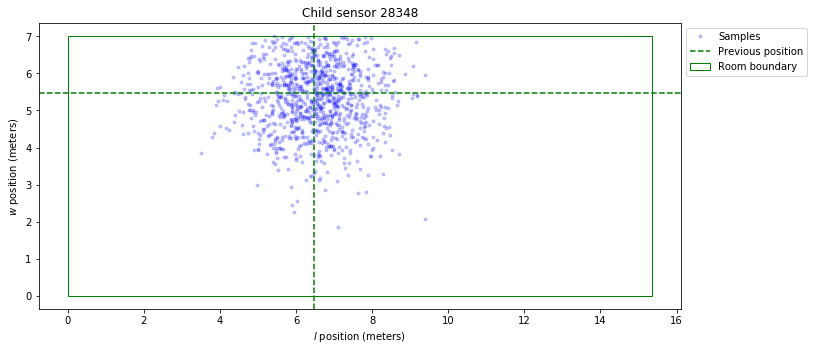

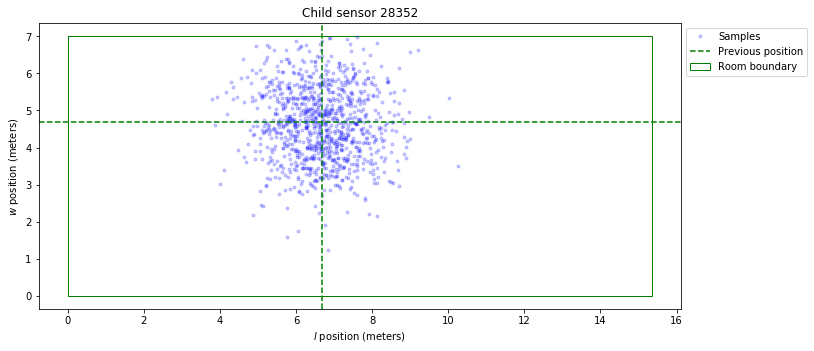

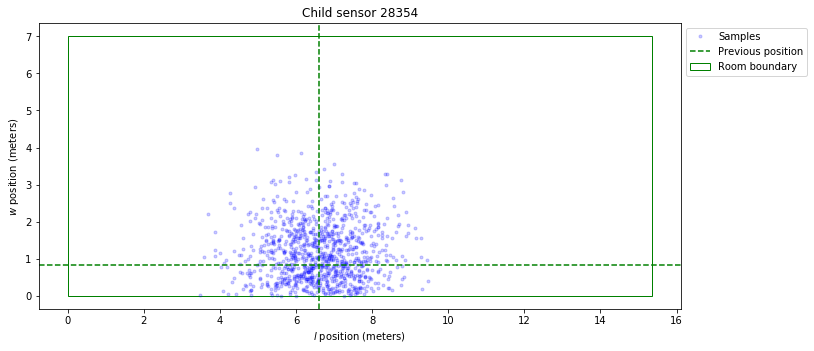

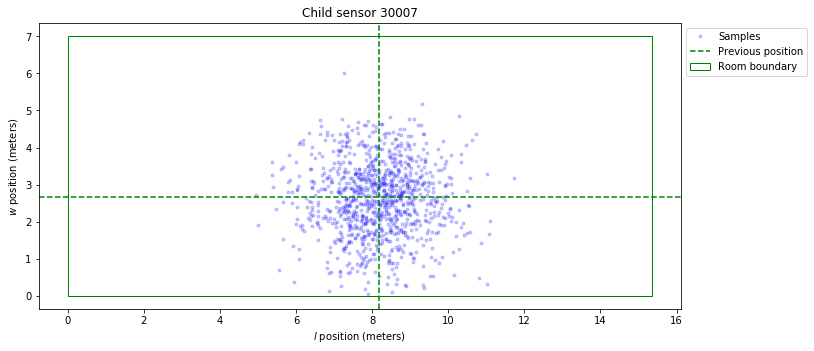

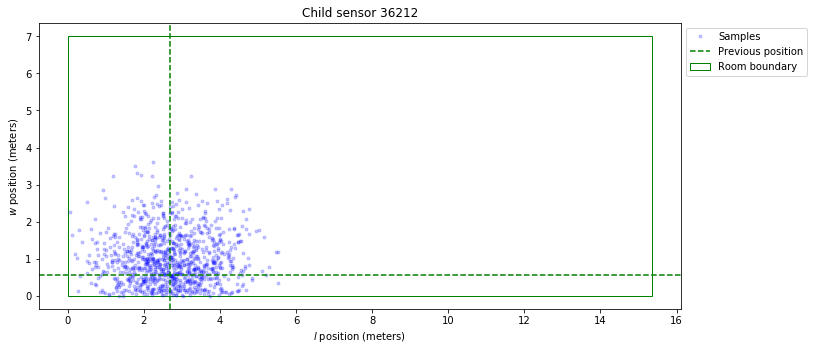

...

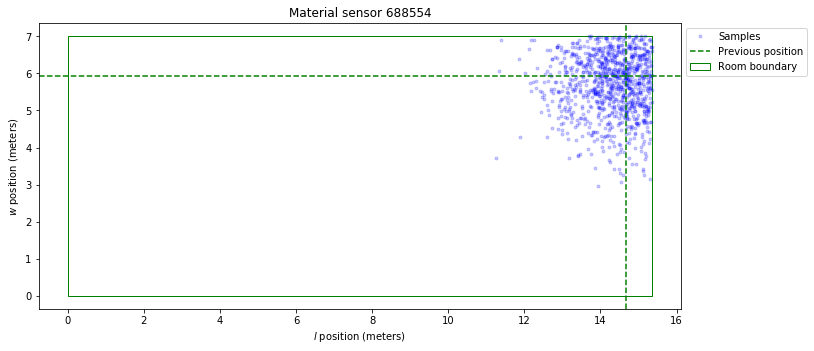

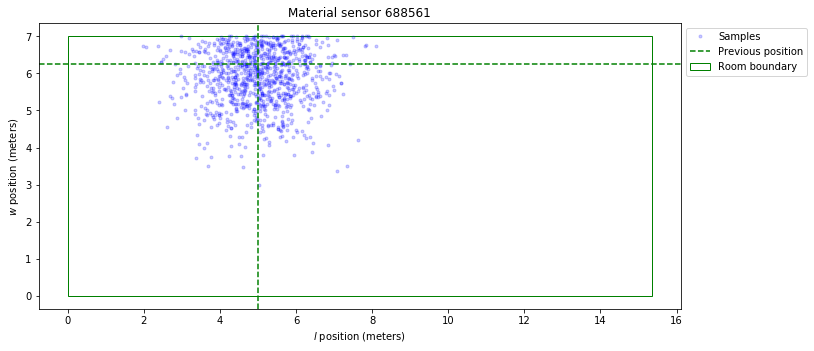

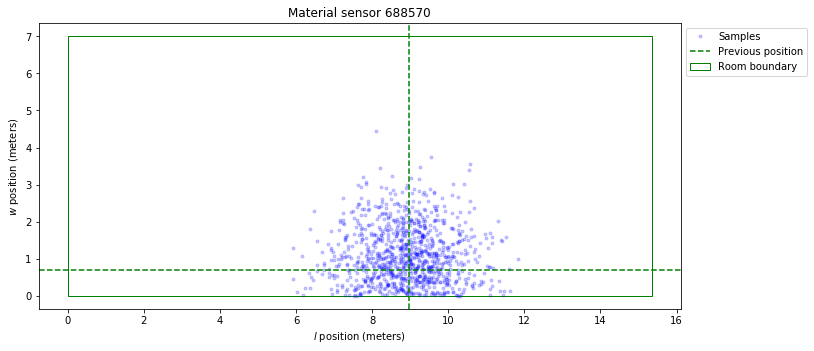

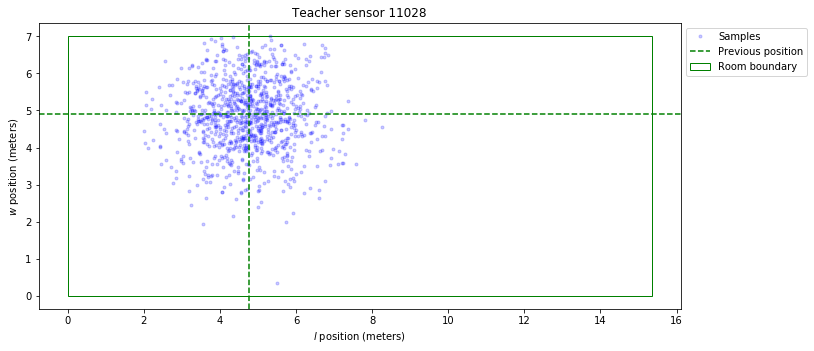

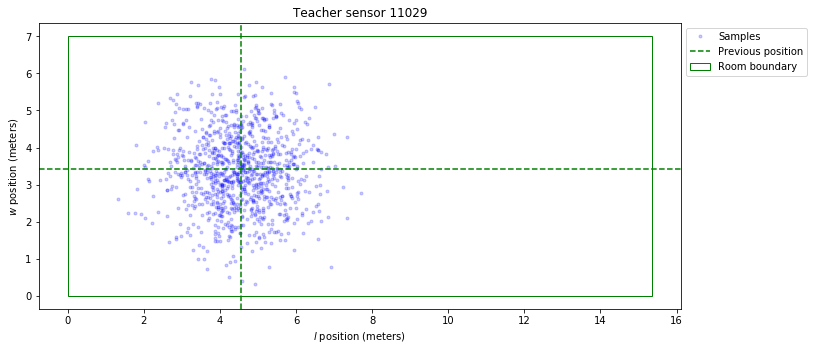

In [58]:
plt.rcParams["figure.figsize"] = room_size*0.75
for sensor_index in range(variable_structure.num_moving_sensors):
    plt.plot(
        x_continuous_bar_x_previous_samples[:,sensor_index*2],
        x_continuous_bar_x_previous_samples[:,sensor_index*2 + 1],
        'b.',
        alpha=0.2,
        label='Samples')
    plt.title(variable_structure.sensor_names[sensor_index])
    plt.xlabel('{} position (meters)'.format(variable_structure.dimension_names[0]))
    plt.ylabel('{} position (meters)'.format(variable_structure.dimension_names[1]))
    plt.axvline(
        x=test_x_continuous_value[sensor_index*2],
        linestyle='dashed',
        color='green',
        label='Previous position')
    plt.axhline(y=test_x_continuous_value[sensor_index*2 + 1], linestyle='dashed', color='green')
    ax=plt.gca()
    ax.add_patch(
        patches.Rectangle(
            (0,0),
            room_size[0],
            room_size[1],
            fill=False,
            color='green',
            label='Room boundary'))
    plt.xlim(0 - 0.05*room_size[0], room_size[0] + 0.05*room_size[0])
    plt.ylim(0 - 0.05*room_size[1], room_size[1] + 0.05*room_size[1])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault['figure.figsize']

In [59]:
y_discrete_bar_x_samples, y_continuous_bar_x_samples = sensor_model.y_bar_x_sample_test(
    np.tile(test_x_discrete_value, (10000,1)),
    np.tile(test_x_continuous_value, (10000,1)))

In [60]:
distances_test_x_continuous_value = sensor_model.distances_test(test_x_continuous_value)

In [61]:
ping_success_probabilities_from_distances_test_x_discrete_value = sensor_model.ping_success_probabilities_from_distances_test(
    distances_test_x_continuous_value)

In [62]:
ping_success_probabilities_from_sensor_statuses_test_x_discrete_value = sensor_model.ping_success_probabilities_from_sensor_statuses_test(
    test_x_discrete_value)

In [63]:
ping_success_probabilities_test_x_discrete_value, ping_failure_probabilities_test_x_discrete_value = sensor_model.ping_success_probabilities_test(
    test_x_discrete_value,
    distances_test_x_continuous_value)

In [64]:
pd.DataFrame.from_items([
    ('sensor_name', variable_structure.sensor_names),
    ('sensor_on', 1 - test_x_discrete_value)
])

,sensor_name,sensor_on
0,Child sensor 28348,1
1,Child sensor 28352,1
2,Child sensor 28354,1
3,Child sensor 30007,1
4,Child sensor 36212,1
5,Child sensor 37757,1
6,Child sensor 37758,1
7,Child sensor 37760,0
8,Child sensor 38394,1
9,Child sensor 55514,1


In [65]:
pd.DataFrame.from_items([
    ('sensor_pair_name', variable_structure.y_discrete_names),
    ('from_sensor_statuses', ping_success_probabilities_from_sensor_statuses_test_x_discrete_value),
    ('from_distances', ping_success_probabilities_from_distances_test_x_discrete_value),
    ('samples', 1 - np.sum(y_discrete_bar_x_samples, axis=0)/10000)
])

,sensor_pair_name,from_sensor_statuses,from_distances,samples
0,Status of ping from Child sensor 28348 to Child sensor 28352,0.999,0.401553,0.4025
1,Status of ping from Child sensor 28348 to Child sensor 28354,0.999,0.078041,0.0782
2,Status of ping from Child sensor 28348 to Child sensor 30007,0.999,0.140160,0.1444
3,Status of ping from Child sensor 28348 to Child sensor 36212,0.999,0.040229,0.0396
4,Status of ping from Child sensor 28348 to Child sensor 37757,0.999,0.107607,0.1123
5,Status of ping from Child sensor 28348 to Child sensor 37758,0.999,0.013406,0.0117
6,Status of ping from Child sensor 28348 to Child sensor 37760,0.001,0.018904,0.0000
7,Status of ping from Child sensor 28348 to Child sensor 38394,0.999,0.140729,0.1412
8,Status of ping from Child sensor 28348 to Child sensor 55514,0.999,0.071581,0.0712
9,Status of ping from Child sensor 28348 to Child sensor 57651,0.999,0.215135,0.2072


Plot the results for 10 randomly chosen discrete $\mathbf{Y}$ variables.

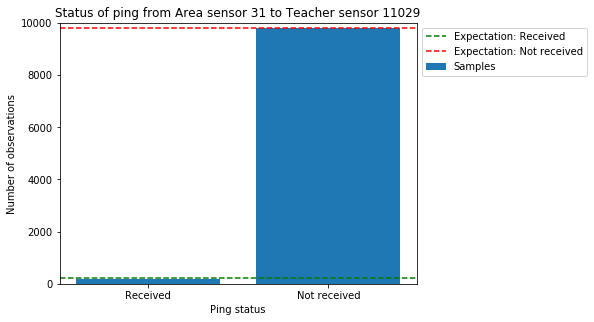

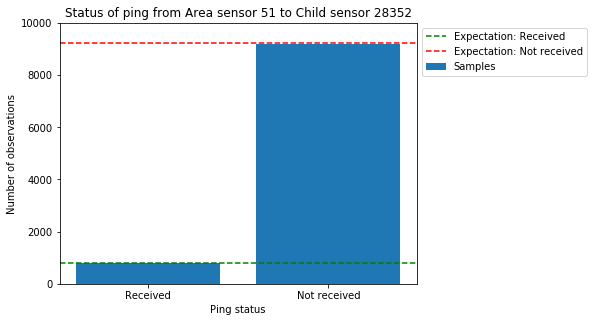

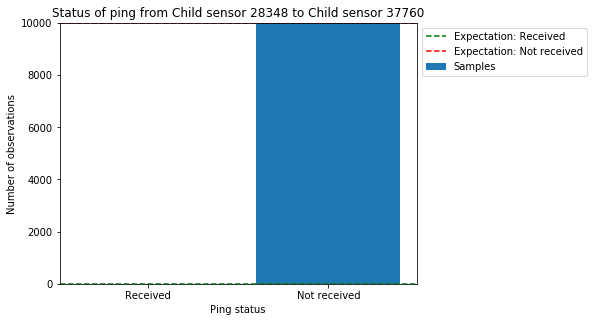

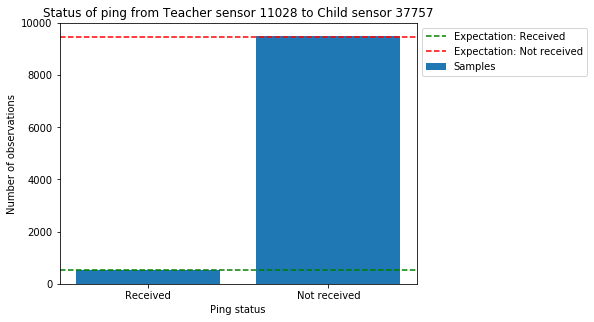

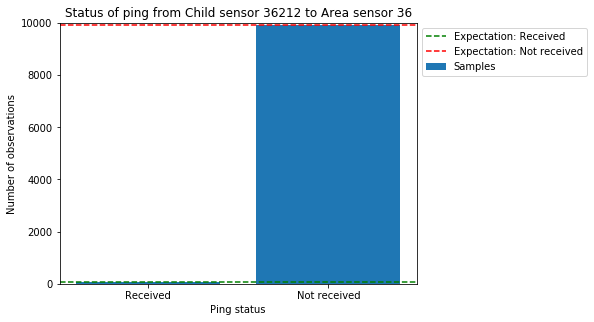

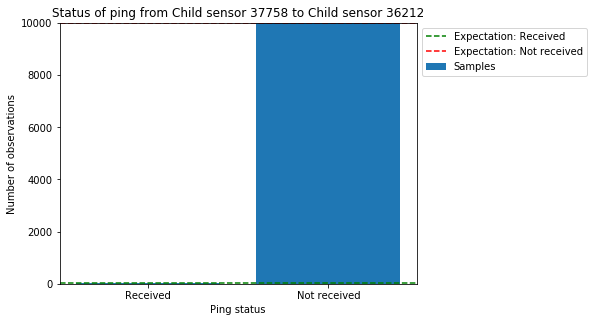

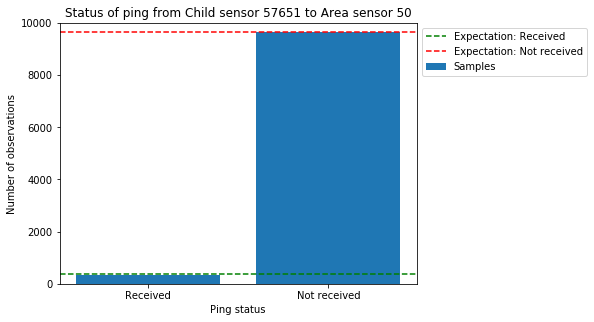

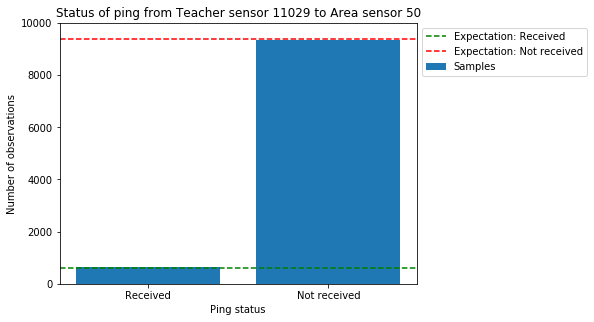

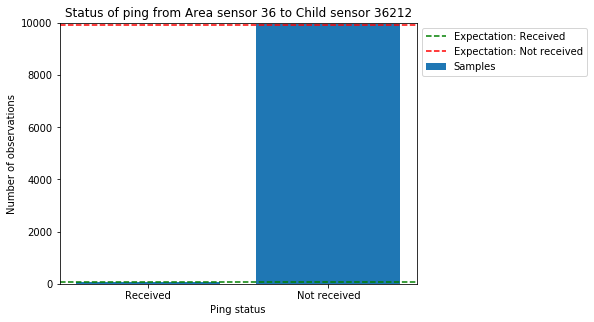

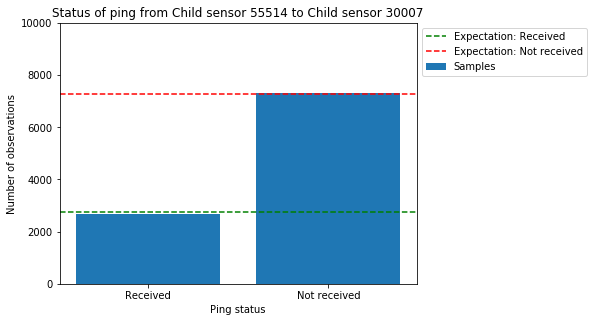

In [66]:
for y_discrete_var_index in np.random.choice(range(variable_structure.num_y_discrete_vars), size=10):
    plt.bar(
        range(variable_structure.num_ping_statuses),
        np.bincount(y_discrete_bar_x_samples[:,y_discrete_var_index]),
        label='Samples')
    ping_success_probability = ping_success_probabilities_test_x_discrete_value[y_discrete_var_index]
    plt.axhline(
        y=ping_success_probability*10000,
        linestyle='dashed',
        color='green',
        label='Expectation: Received')
    plt.axhline(
        y=(1 - ping_success_probability)*10000,
        linestyle='dashed',
        color='red',
        label='Expectation: Not received')
    plt.xticks(range(variable_structure.num_ping_statuses), variable_structure.ping_status_names)
    plt.xlabel('Ping status')
    plt.ylabel('Number of observations')
    plt.title(variable_structure.y_discrete_names[y_discrete_var_index])
    plt.ylim(0, 10000)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

Plot these samples for 10 randomly chosen continuous $\mathbf{Y}$ variables.

c:\users\tcqui\dropbox\wildflower\sensors\data_analysis\sensor_localization\venv\lib\site-packages\scipy\stats\_continuous_distns.py:5374: RuntimeWarning: invalid value encountered in multiply
  mu2 = 1 + (a*pA - b*pB) / d - mu*mu


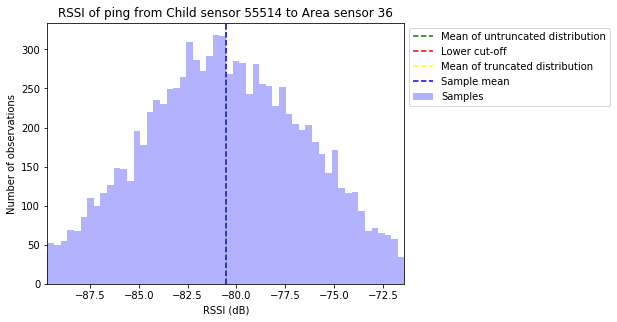

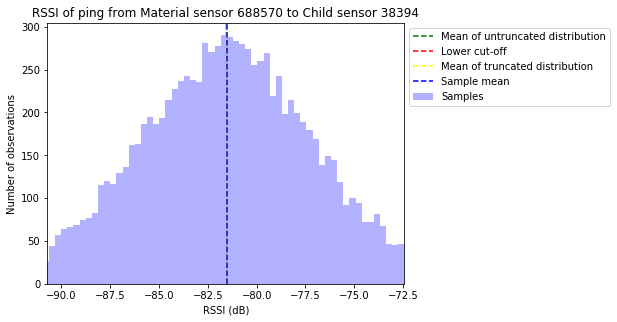

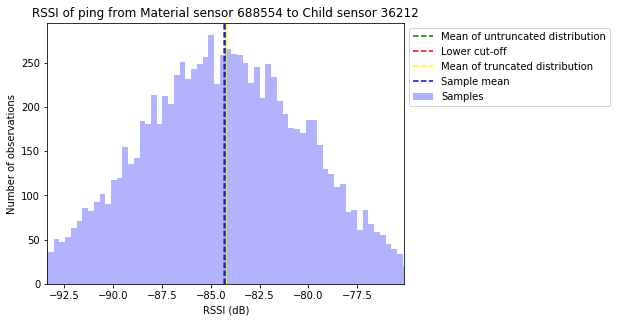

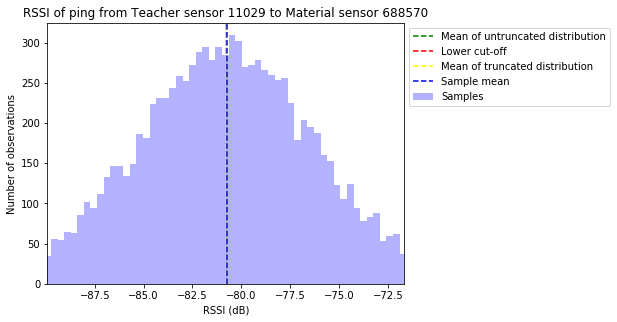

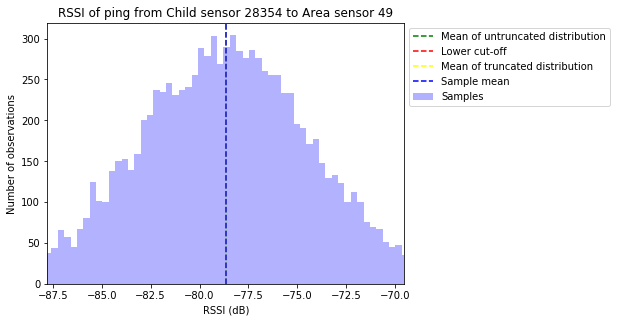

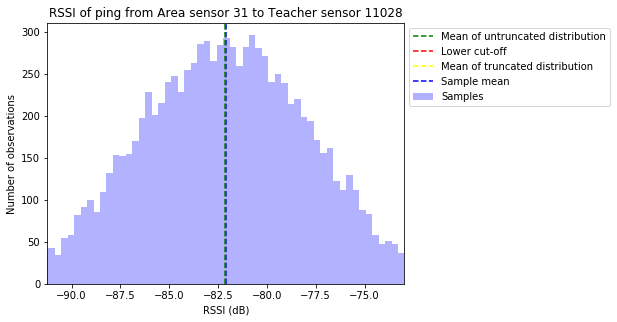

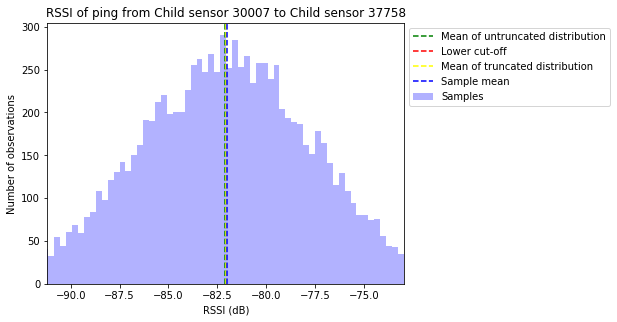

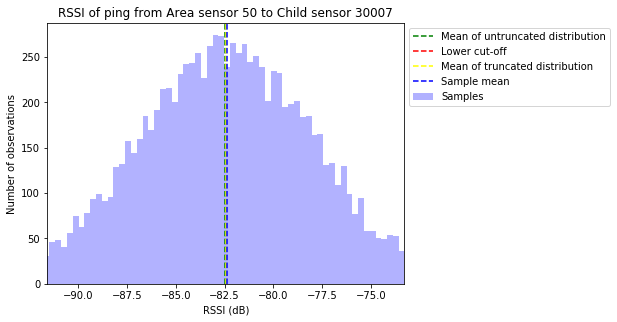

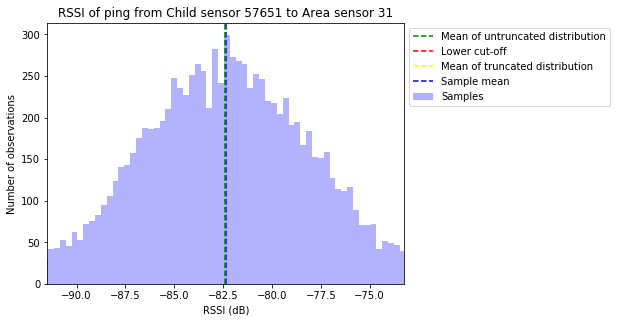

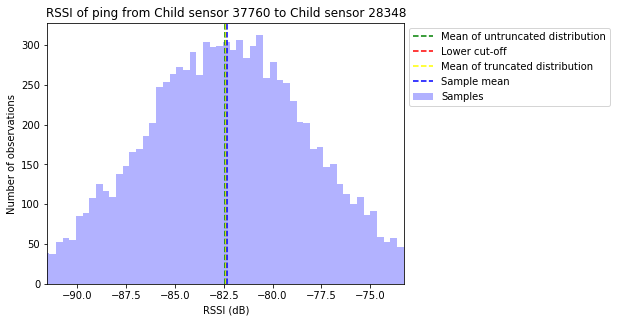

In [67]:
for y_continuous_var_index in np.random.choice(range(variable_structure.num_y_continuous_vars), size=10):
    plt.hist(
        y_continuous_bar_x_samples[:,y_continuous_var_index],
        bins=100,
        facecolor='blue',
        alpha=0.3,
        label='Samples')
    plt.axvline(
        x=sensor_model.rssi_untruncated_mean_test(distances_test_x_continuous_value[y_continuous_var_index]),
        linestyle='dashed',
        color='green',
        label='Mean of untruncated distribution')
    plt.axvline(
        sensor_model.lower_rssi_cutoff,
        linestyle='dashed',
        color='red',
        label='Lower cut-off')
    plt.axvline(
        x=sensor_model.rssi_truncated_mean_test(distances_test_x_continuous_value[y_continuous_var_index]),
        linestyle='dashed',
        color='yellow',
        label='Mean of truncated distribution')
    plt.axvline(
        np.mean(y_continuous_bar_x_samples[:,y_continuous_var_index]),
        linestyle='dashed',
        color='blue',
        label='Sample mean')
    plt.xlabel('RSSI (dB)')
    plt.ylabel('Number of observations')
    plt.title(variable_structure.y_continuous_names[y_continuous_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.xlim(
        sensor_model.rssi_truncated_mean_test(distances_test_x_continuous_value[y_continuous_var_index]) - 2*sensor_model.rssi_untruncated_std_dev,
        sensor_model.rssi_truncated_mean_test(distances_test_x_continuous_value[y_continuous_var_index]) + 2*sensor_model.rssi_untruncated_std_dev)
    plt.show()

Using our test value for $\mathbf{X}$, plot the dependence of $f(\mathbf{Y} | \mathbf{X})$ on each sensor reading (holding the values of all of the other sensor readings fixed), to make sure it has the shape we expect. First we plot the dependence on the discrete sensor variables for 10 randomly chosen variables.

c:\users\tcqui\dropbox\wildflower\sensors\data_analysis\sensor_localization\venv\lib\site-packages\scipy\stats\_continuous_distns.py:5374: RuntimeWarning: invalid value encountered in multiply
  mu2 = 1 + (a*pA - b*pB) / d - mu*mu


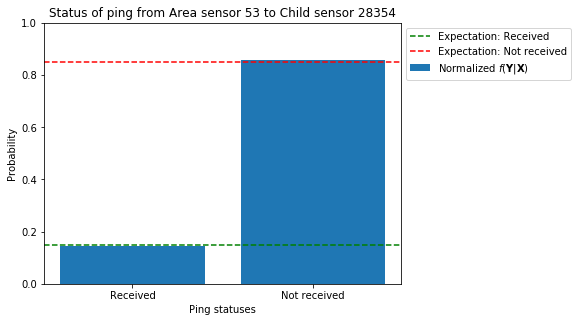

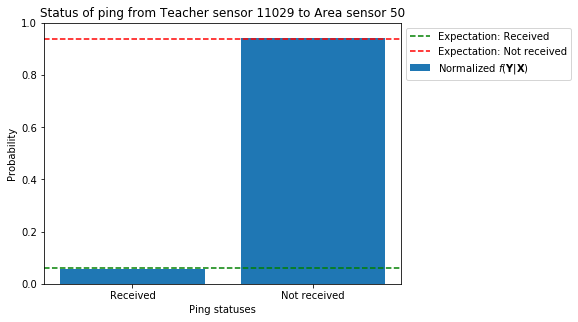

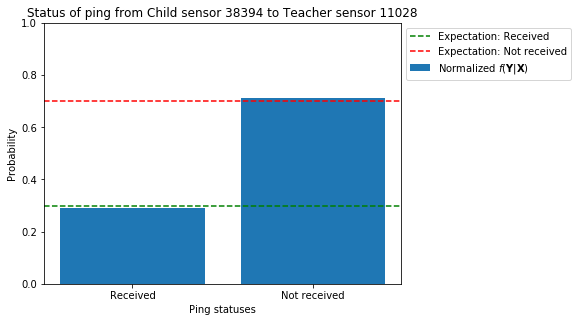

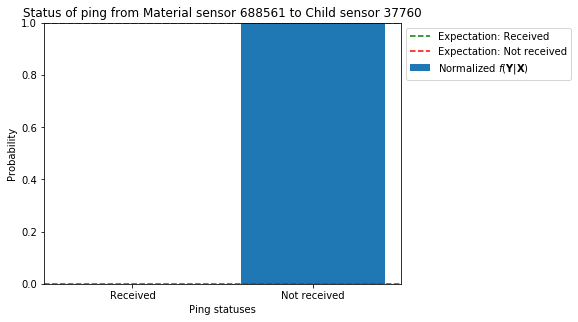

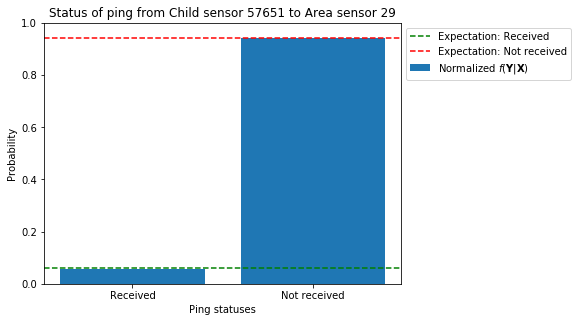

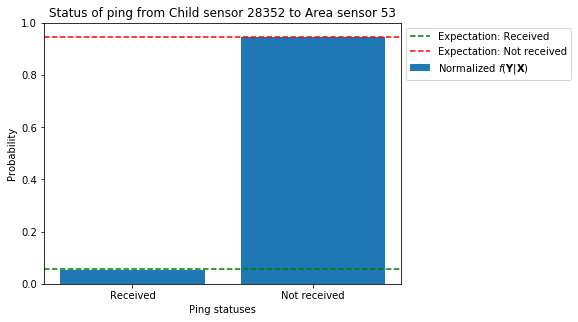

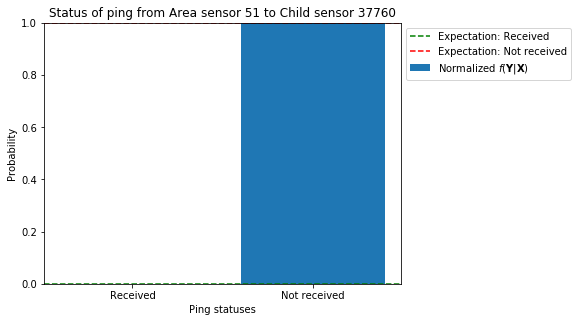

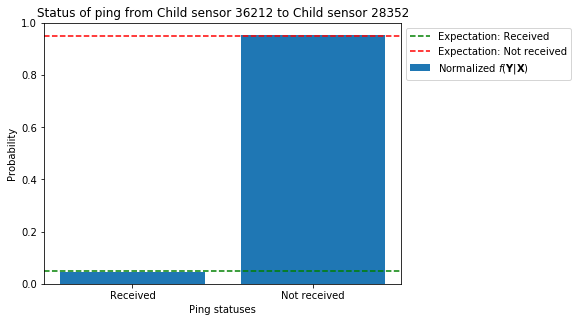

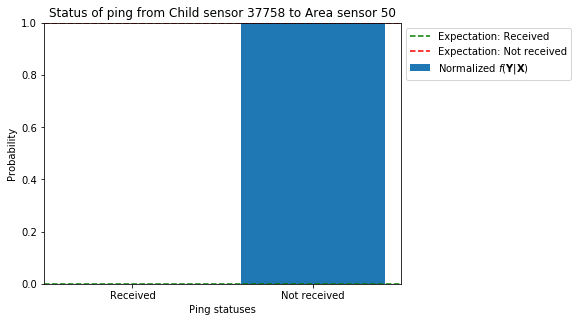

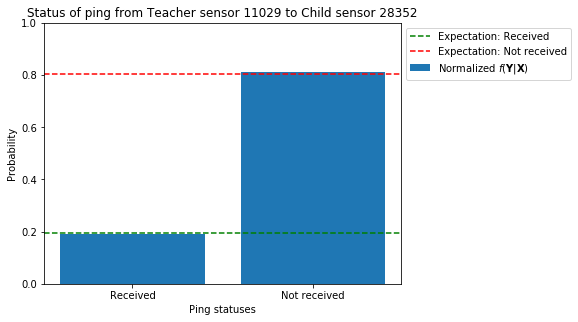

In [68]:
num_rssi_test_values = 100
mean_rssi_values = sensor_model.rssi_truncated_mean_test(distances_test_x_continuous_value)
for y_discrete_var_index in np.random.choice(range(variable_structure.num_y_discrete_vars), size=10):
    log_probability_range = np.zeros(2, dtype='float')
    log_probability_density_range = np.zeros(num_rssi_test_values, dtype='float')
    test_x_discrete_values = np.tile(test_x_discrete_value, (num_rssi_test_values, 1))
    test_x_continuous_values = np.tile(test_x_continuous_value, (num_rssi_test_values, 1))
    test_y_discrete_value = np.int32(1 - ping_success_probabilities_from_sensor_statuses_test_x_discrete_value)
    test_y_discrete_value[y_discrete_var_index] = 0
    test_y_discrete_values = np.tile(test_y_discrete_value, (num_rssi_test_values, 1))
    rssi_range=np.linspace(
        mean_rssi_values[y_discrete_var_index] - 2*sensor_model.rssi_untruncated_std_dev,
        mean_rssi_values[y_discrete_var_index] + 2*sensor_model.rssi_untruncated_std_dev,
        num_rssi_test_values)
    test_y_continuous_values = np.tile(mean_rssi_values, (num_rssi_test_values, 1))
    for rssi_index in range(num_rssi_test_values):
        test_y_continuous_values[rssi_index, y_discrete_var_index] = rssi_range[rssi_index]
    log_probability_density_range = sensor_model.y_bar_x_log_pdf_test(
        test_x_discrete_values,
        test_x_continuous_values,
        test_y_discrete_values,
        test_y_continuous_values)
    log_probability_range[0] = special.logsumexp(log_probability_density_range) + math.log(rssi_range[1]-rssi_range[0])
    test_y_discrete_value = np.int32(1 - ping_success_probabilities_from_sensor_statuses_test_x_discrete_value)
    test_y_discrete_value[y_discrete_var_index] = 1
    test_y_continuous_value = mean_rssi_values
    log_probability_range[1] = sensor_model.y_bar_x_log_pdf_test(
        test_x_discrete_value,
        test_x_continuous_value,
        test_y_discrete_value,
        test_y_continuous_value)
    log_probability_range = log_probability_range - special.logsumexp(log_probability_range)
    plt.bar(
        range(variable_structure.num_ping_statuses),
        np.exp(log_probability_range),
        label='Normalized $f(\mathbf{Y}|\mathbf{X})$')
    ping_success_probability = ping_success_probabilities_test_x_discrete_value[y_discrete_var_index]
    plt.axhline(
        y=ping_success_probability,
        linestyle='dashed',
        color='green',
        label='Expectation: Received')
    plt.axhline(
        y=(1 - ping_success_probability),
        linestyle='dashed',
        color='red',
        label='Expectation: Not received')
    plt.xticks(range(variable_structure.num_ping_statuses), variable_structure.ping_status_names)
    plt.ylim(0,1)
    plt.xlabel('Ping statuses')
    plt.ylabel('Probability')
    plt.title(variable_structure.y_discrete_names[y_discrete_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

Now we plot the dependence on the continuous sensor variables for 10 randomly chosen variables.

c:\users\tcqui\dropbox\wildflower\sensors\data_analysis\sensor_localization\venv\lib\site-packages\scipy\stats\_continuous_distns.py:5374: RuntimeWarning: invalid value encountered in multiply
  mu2 = 1 + (a*pA - b*pB) / d - mu*mu


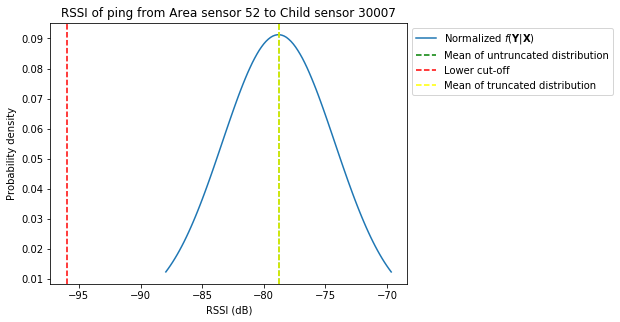

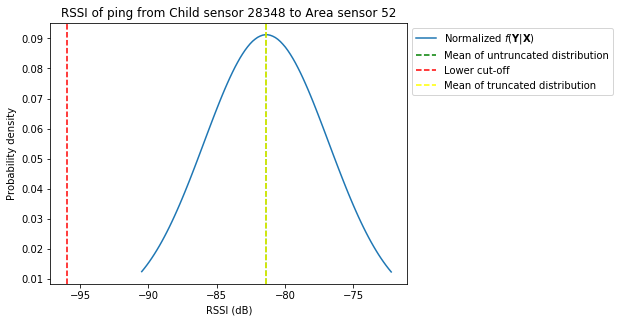

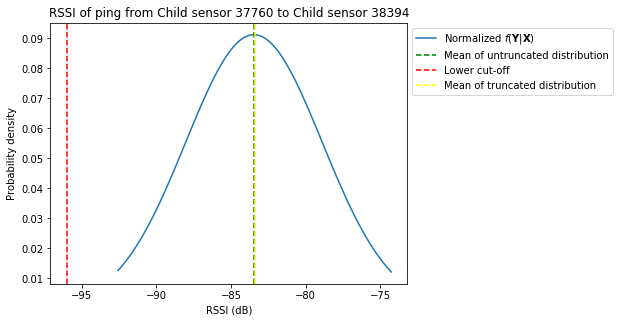

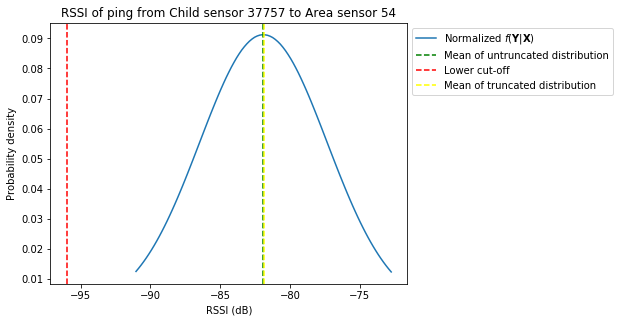

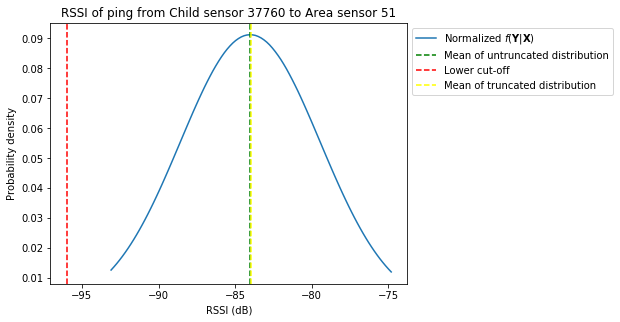

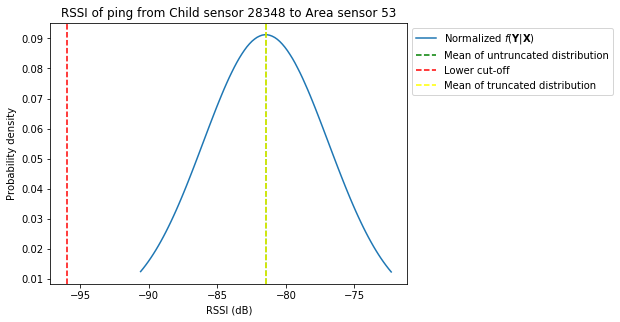

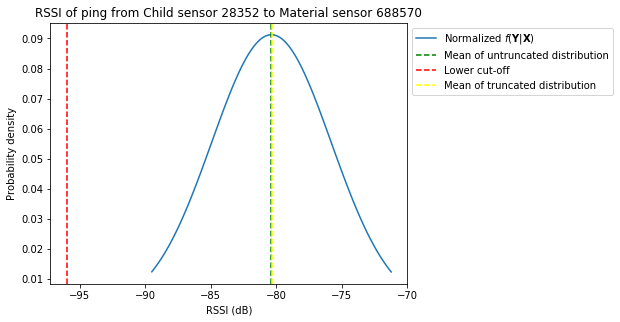

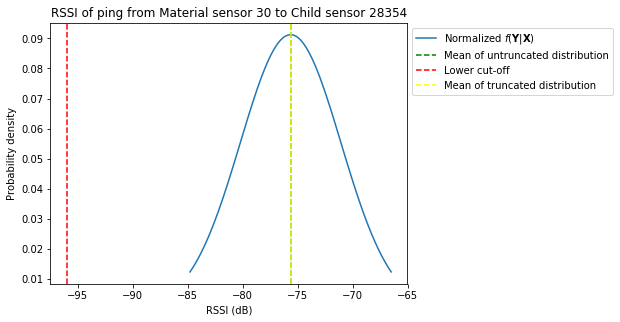

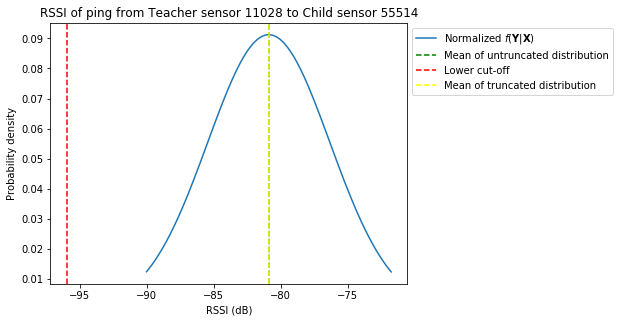

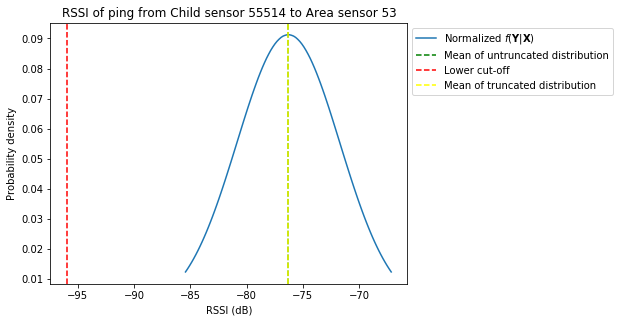

In [69]:
num_rssi_test_values = 100
mean_rssi_values = sensor_model.rssi_truncated_mean_test(distances_test_x_continuous_value)
for y_continuous_var_index in np.random.choice(range(variable_structure.num_y_continuous_vars), size=10):
    log_probability_density_range = np.zeros(100, dtype='float')
    test_x_discrete_values = np.tile(np.repeat(0, sensor_model.num_x_discrete_vars),
                                     (num_rssi_test_values, 1))
    test_x_continuous_values = np.tile(test_x_continuous_value, (num_rssi_test_values, 1))
    test_y_discrete_values = np.tile(np.repeat(0, sensor_model.num_y_discrete_vars),
                                     (num_rssi_test_values, 1))
    test_y_continuous_values = np.tile(mean_rssi_values, (num_rssi_test_values, 1))
    rssi_range=np.linspace(
        mean_rssi_values[y_continuous_var_index] - 2*sensor_model.rssi_untruncated_std_dev,
        mean_rssi_values[y_continuous_var_index] + 2*sensor_model.rssi_untruncated_std_dev,
        num_rssi_test_values)
    for rssi_index in range(num_rssi_test_values):
        test_y_continuous_values[rssi_index, y_continuous_var_index] = rssi_range[rssi_index]
    log_probability_density_range = sensor_model.y_bar_x_log_pdf_test(
        test_x_discrete_values,
        test_x_continuous_values,
        test_y_discrete_values,
        test_y_continuous_values)
    log_probability_density_range = log_probability_density_range - (special.logsumexp(log_probability_density_range) + math.log(rssi_range[1]-rssi_range[0]))
    plt.plot(rssi_range, np.exp(log_probability_density_range), label='Normalized $f(\mathbf{Y} | \mathbf{X})$')
    plt.axvline(
        x=sensor_model.rssi_untruncated_mean_test(distances_test_x_continuous_value[y_continuous_var_index]),
        linestyle='dashed',
        color='green',
        label='Mean of untruncated distribution')
    plt.axvline(
        sensor_model.lower_rssi_cutoff,
        linestyle='dashed',
        color='red',
        label='Lower cut-off')
    plt.axvline(
        x=sensor_model.rssi_truncated_mean_test(distances_test_x_continuous_value[y_continuous_var_index]),
        linestyle='dashed',
        color='yellow',
        label='Mean of truncated distribution')
    plt.xlabel('RSSI (dB)')
    plt.ylabel('Probability density')
    plt.title(variable_structure.y_continuous_names[y_continuous_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

## Explore and visualize model outputs

### Real data

Plot particle filter diagnostics.

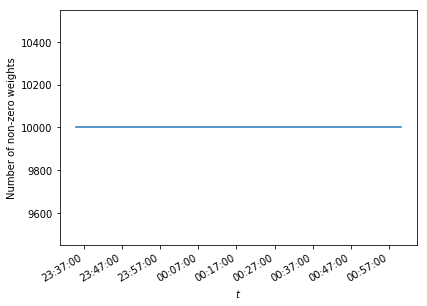

In [70]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
plt.plot(t_test, num_nonzero_weights)
plt.gcf().autofmt_xdate()
plt.xlabel('$t$')
plt.ylabel('Number of non-zero weights')
plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

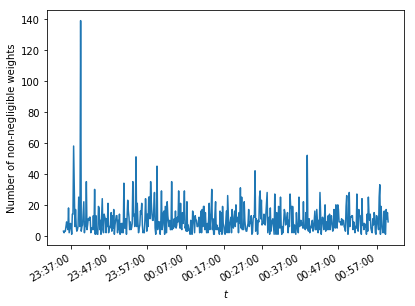

In [71]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
plt.plot(t_test, num_nonnegligible_weights)
plt.gcf().autofmt_xdate()
plt.xlabel('$t$')
plt.ylabel('Number of non-negligible weights')
plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

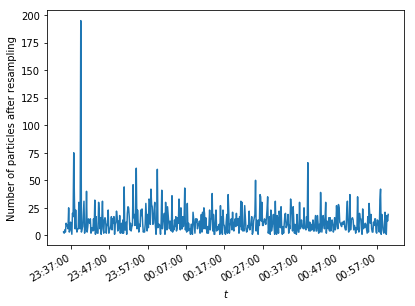

In [72]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
plt.plot(t_test[:-1], num_after_resampling)
plt.gcf().autofmt_xdate()
plt.xlabel('$t$')
plt.ylabel('Number of particles after resampling')
plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

Plot the sample means of the particles. This represents our best guess at state of the system.

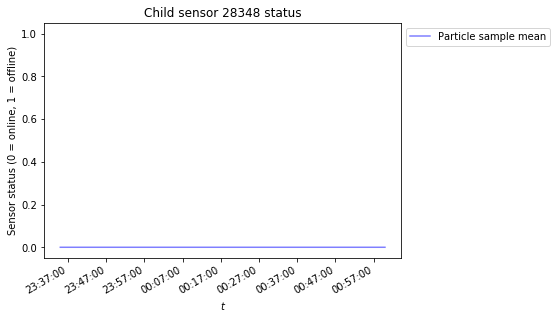

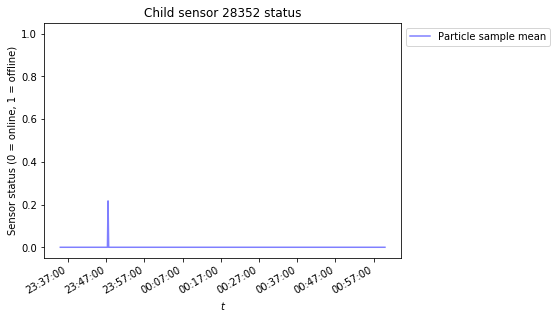

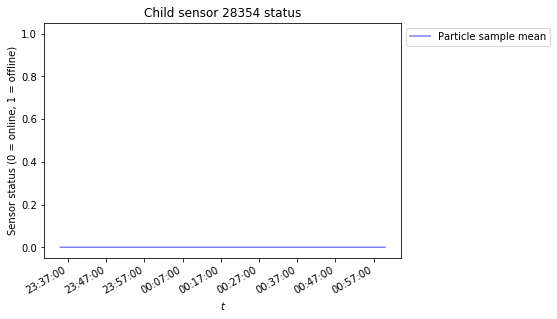

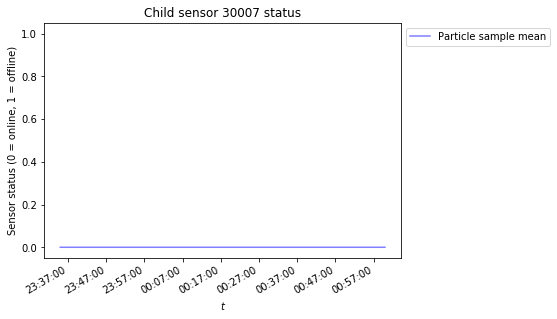

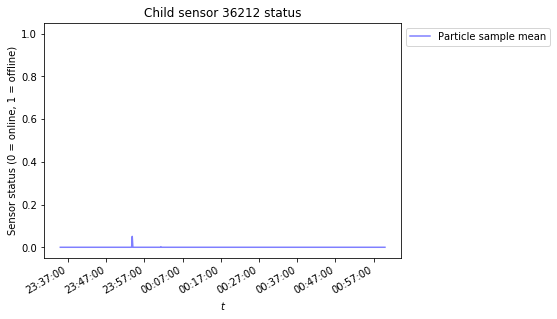

...

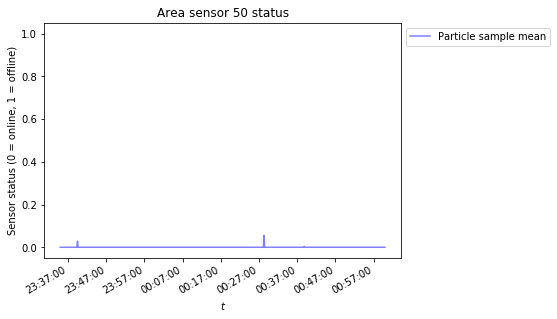

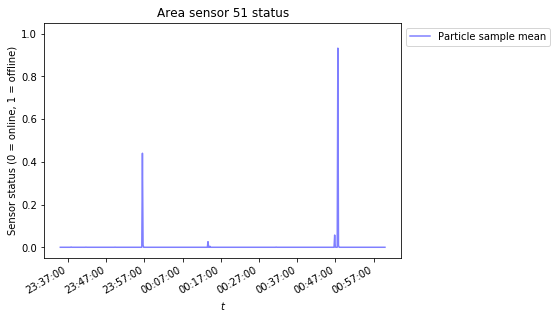

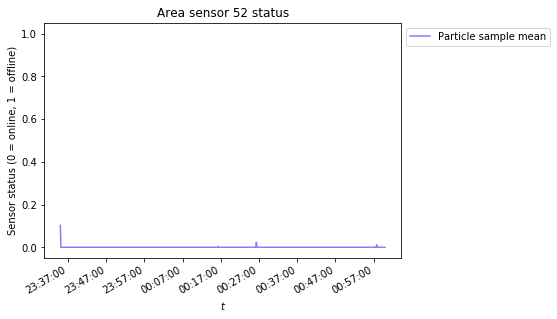

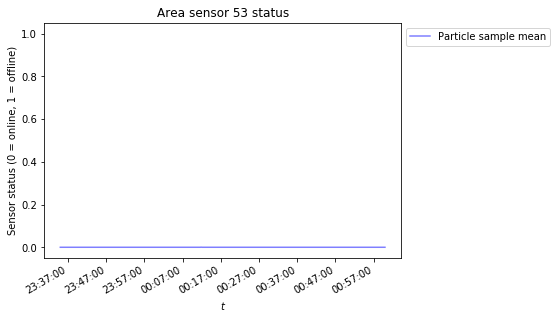

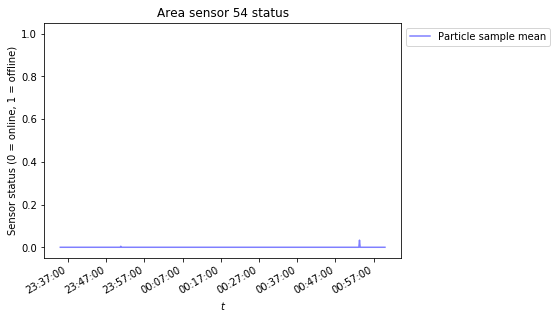

In [73]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_discrete_vars):
    plt.plot(
        t_test,
        x_discrete_mean_particle[:,x_var_index],
        'b-',
        alpha=0.5,
        label='Particle sample mean')
    plt.gcf().autofmt_xdate()
    plt.ylim(-0.05, 1.05)
    plt.xlabel('$t$')
    plt.ylabel('Sensor status (0 = online, 1 = offline)')
    plt.title(variable_structure.x_discrete_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

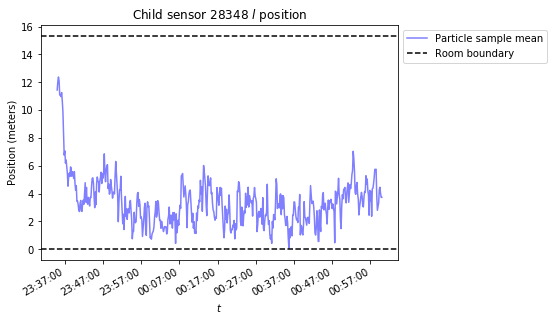

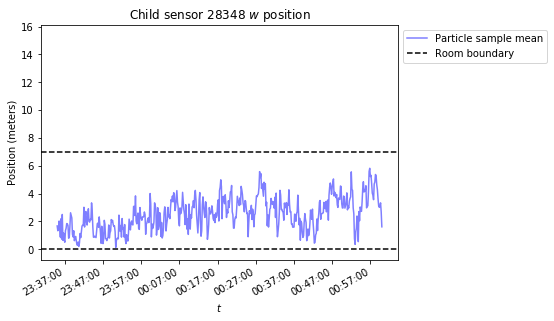

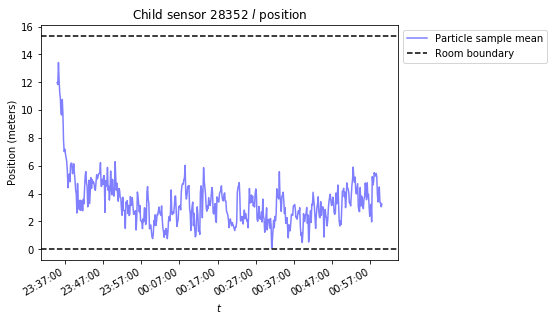

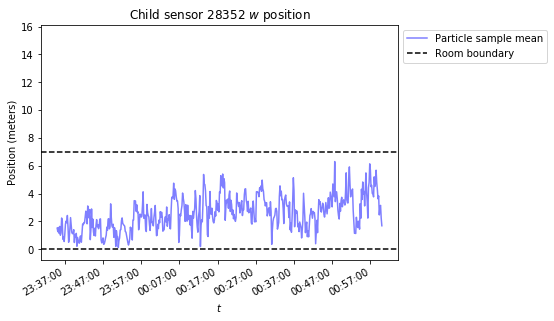

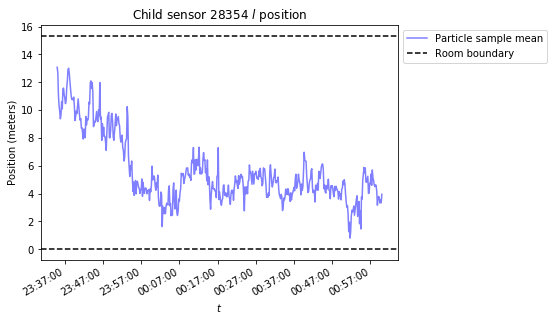

...

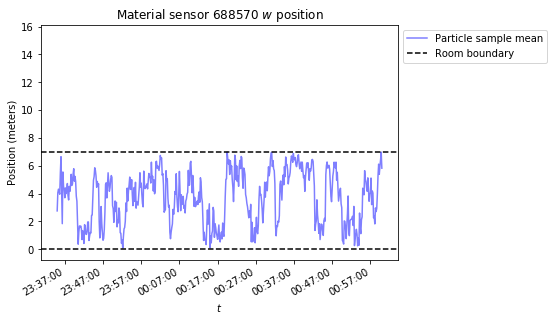

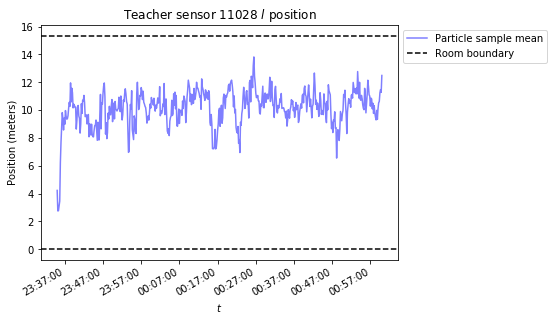

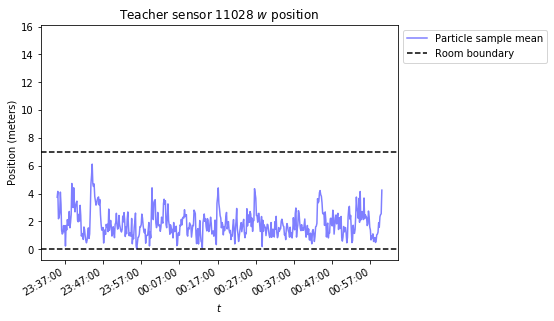

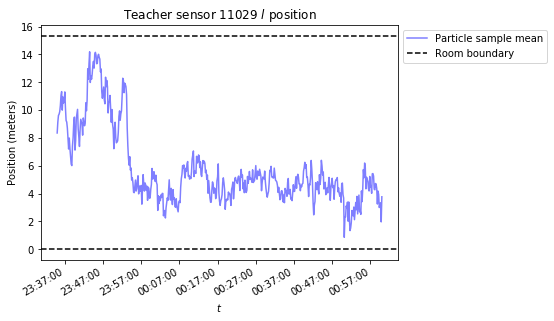

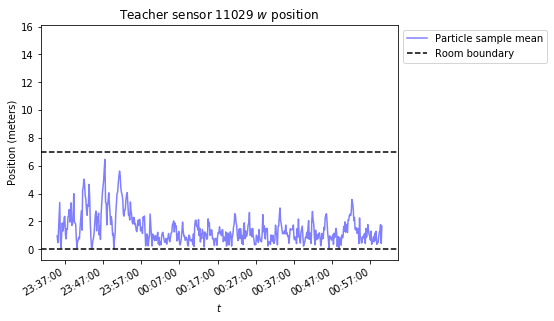

In [74]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.plot(
        t_test,
        x_continuous_mean_particle[:,x_var_index],
        'b-',
        alpha=0.5,
        label='Particle sample mean')
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(
        0 - 0.05*np.max(room_size),
        np.max(room_size) + 0.05*np.max(room_size))
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

Plot the sample confidence regions of the particles (i.e., sample means plus/minus sample standard deviations).

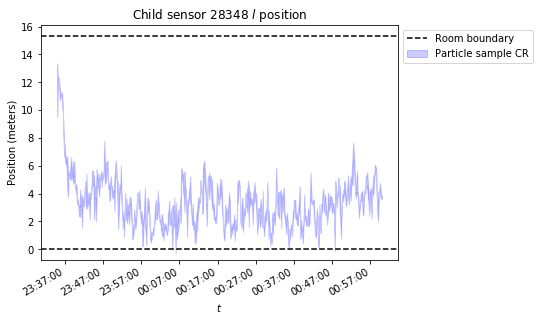

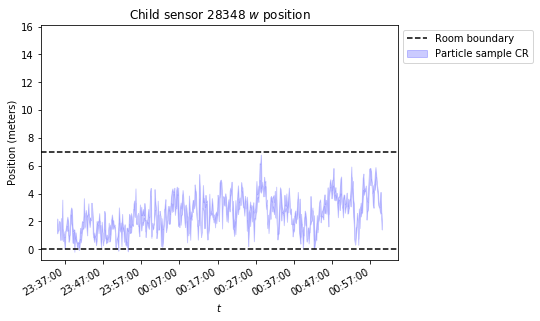

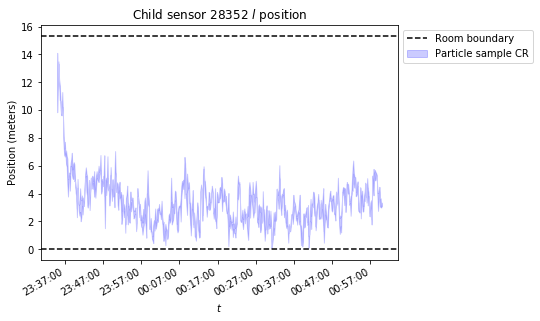

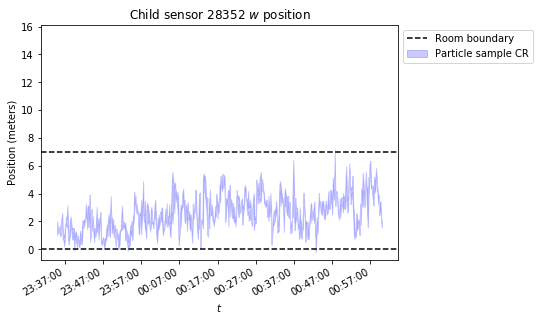

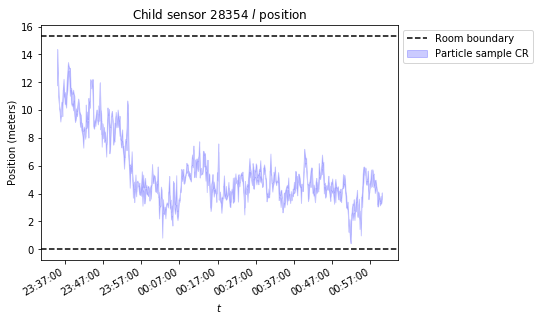

...

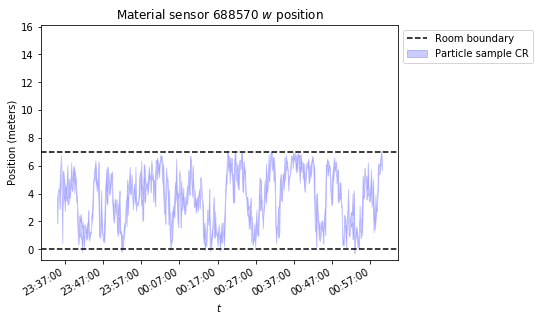

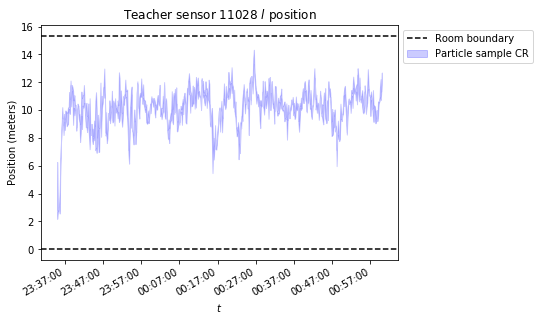

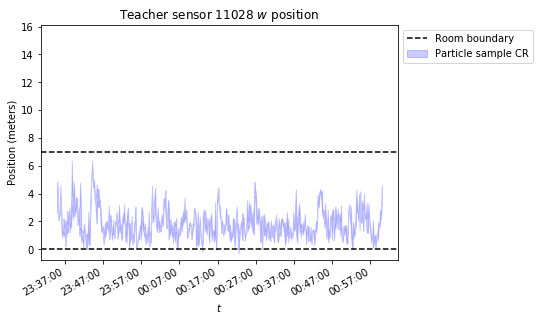

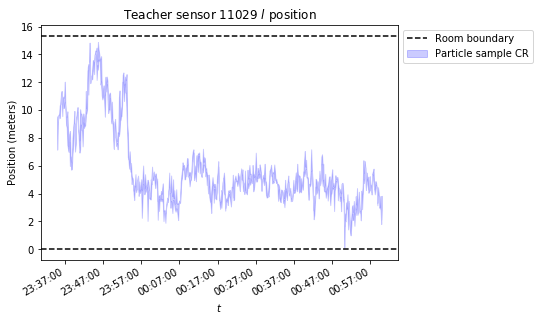

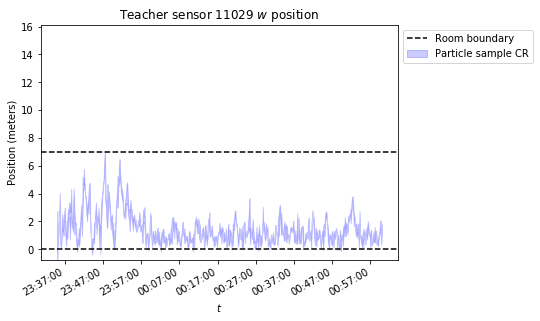

In [75]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.fill_between(
        t_test,
        x_continuous_mean_particle[:,x_var_index] - x_continuous_sd_particle[:, x_var_index],
        x_continuous_mean_particle[:,x_var_index] + x_continuous_sd_particle[:, x_var_index],
        color='blue',
        alpha=0.2,
        label='Particle sample CR'
    )
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(
        0 - 0.05*np.max(room_size),
        np.max(room_size) + 0.05*np.max(room_size))
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

### Simulation

Plot the (simulated) actual statuses of the sensors to make sure they have the properties we expect.

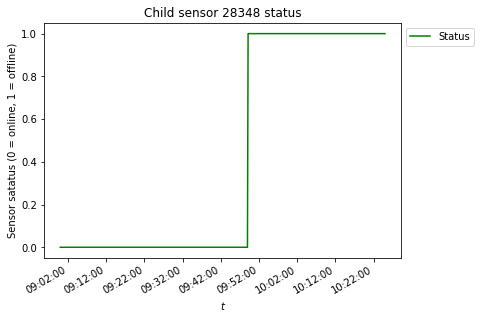

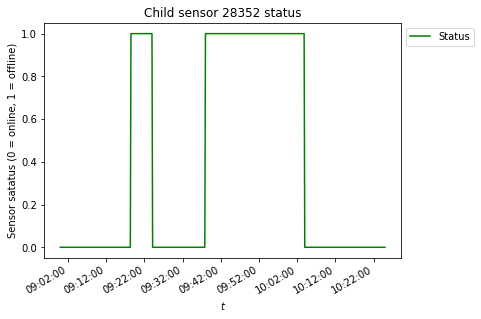

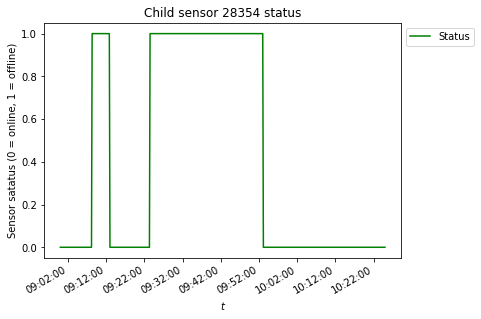

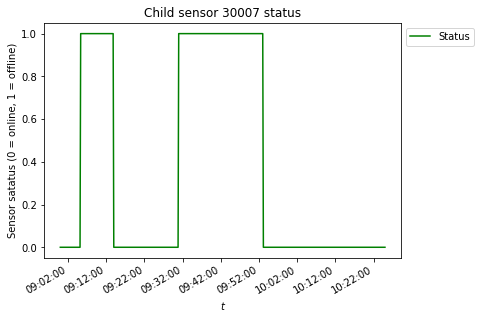

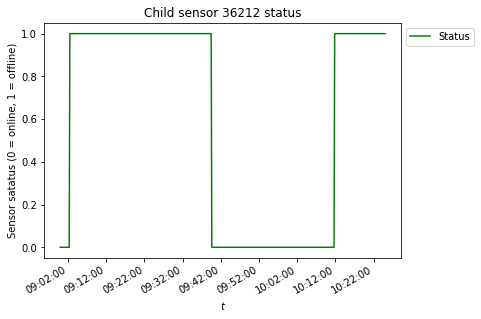

...

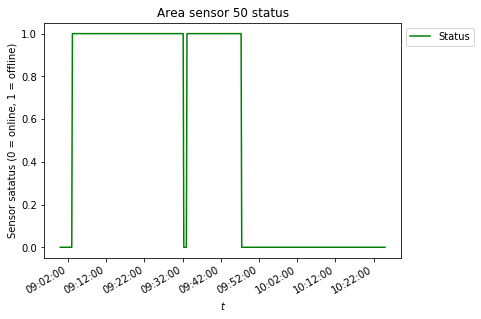

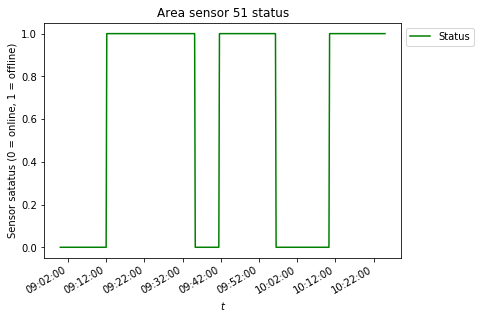

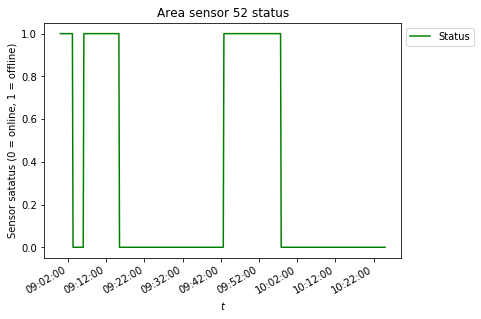

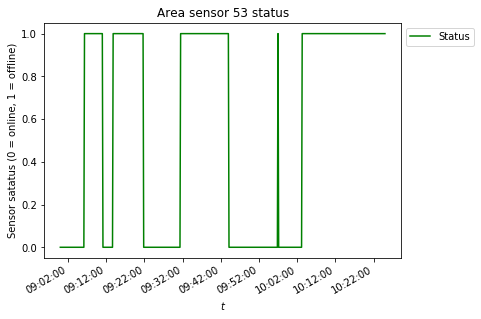

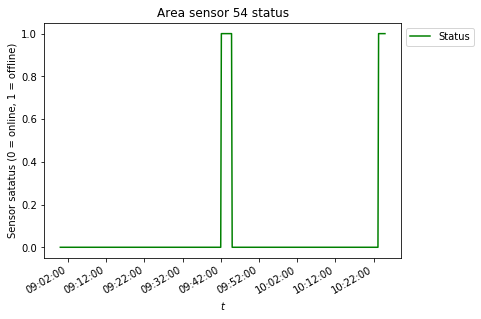

In [76]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_discrete_var_index in range(variable_structure.num_x_discrete_vars):
    plt.plot(
        t_sim,
        x_discrete_t_sim[:, x_discrete_var_index],
        'g-',
        label='Status')
    plt.gcf().autofmt_xdate()
    plt.plot
    plt.ylim(-0.05, 1.05)
    plt.xlabel('$t$')
    plt.ylabel('Sensor satatus (0 = online, 1 = offline)')
    plt.title(variable_structure.x_discrete_names[x_discrete_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

Plot the (simulated) actual positions of the sensors to make sure they have the properties we expect.

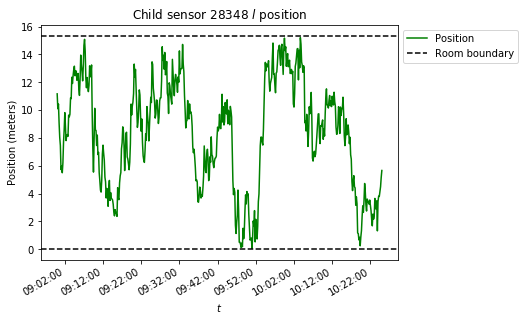

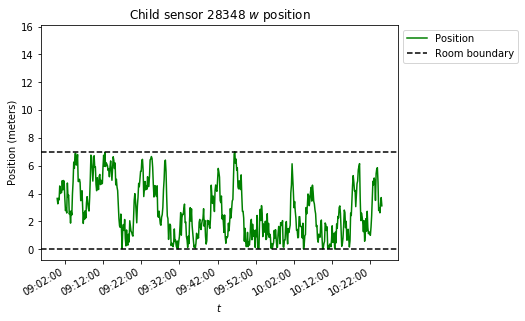

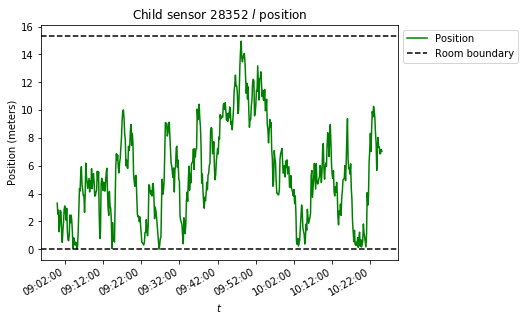

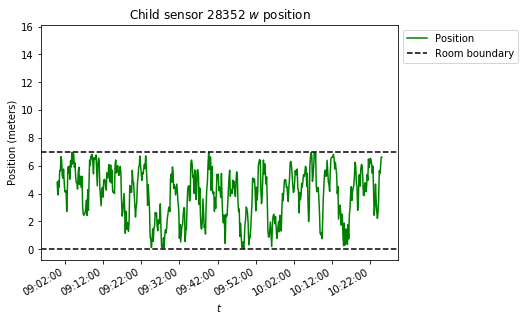

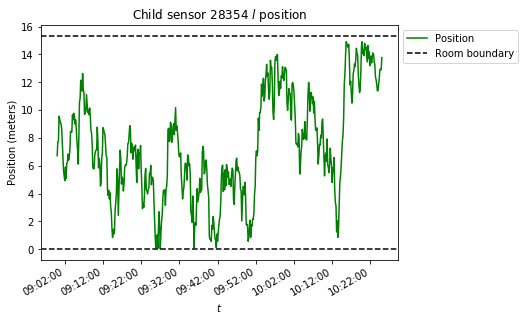

...

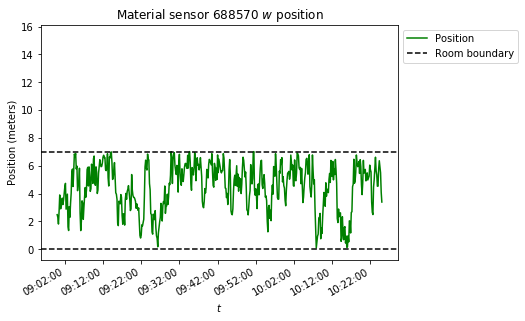

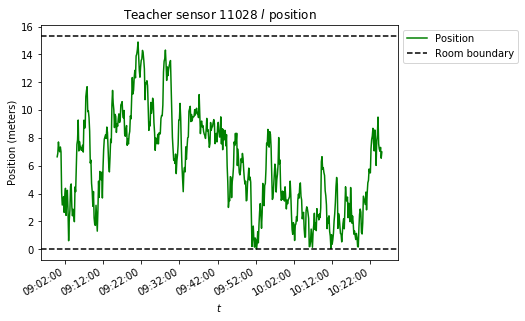

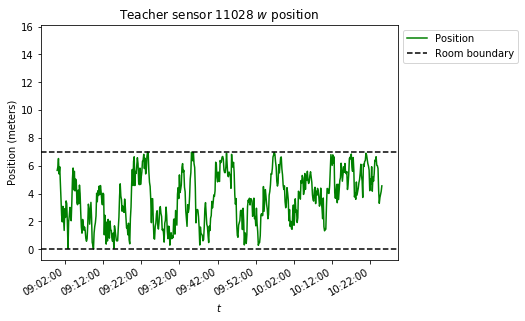

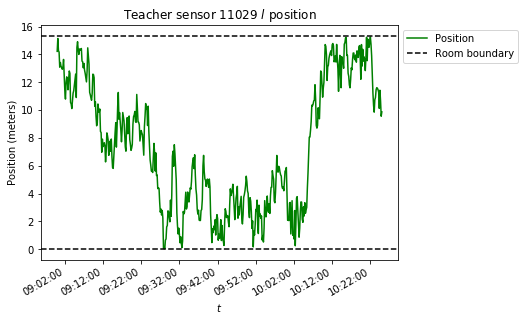

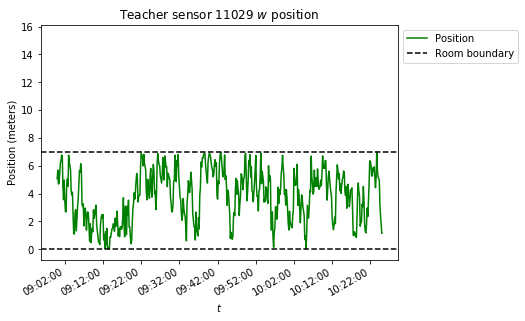

In [77]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.plot(
        t_sim,
        x_continuous_t_sim[:, x_var_index],
        'g-',
        label='Position')
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(
        0 - 0.05*np.max(room_size),
        np.max(room_size) + 0.05*np.max(room_size))
    plt.plot
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

For 10 randomly chosen pairs of sensors, plot the (simulated) measured ping statuses against the (simulated) distances between the sensors. We should see more missed pings for larger distances, but with a lot of noise.

In [78]:
distances_t_sim = sensor_model.distances_test(x_continuous_t_sim)

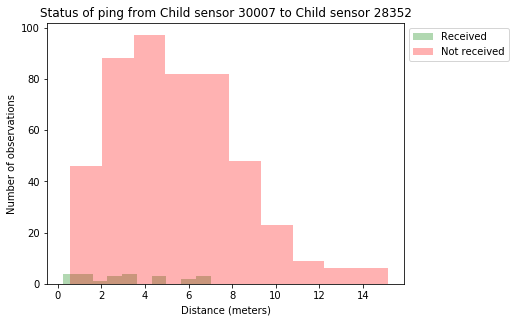

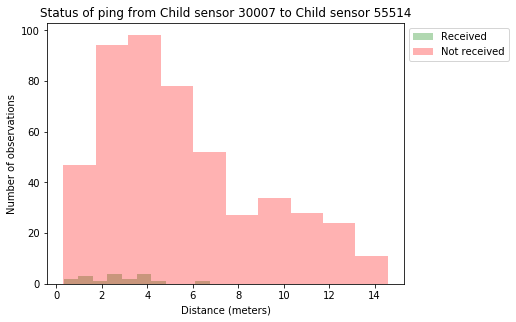

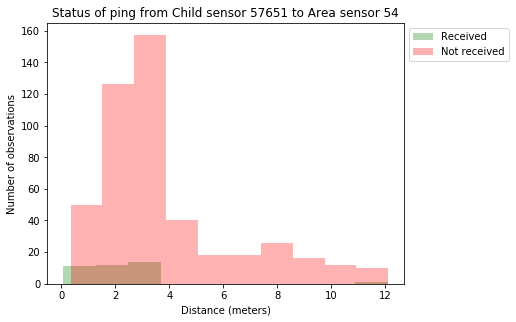

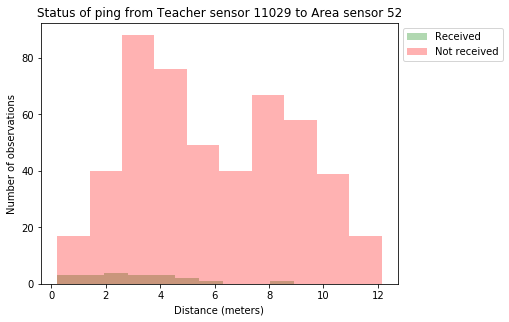

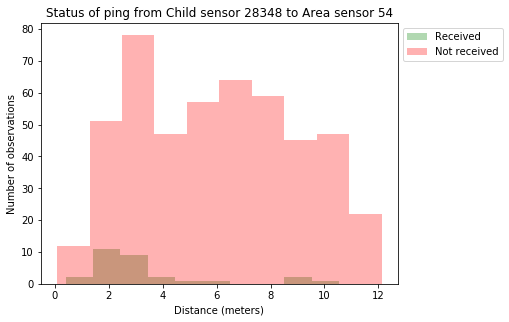

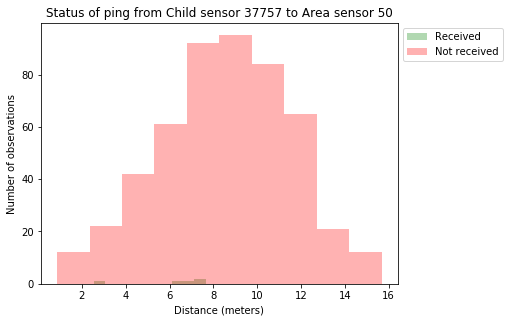

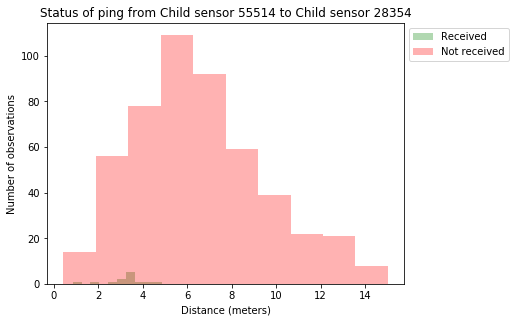

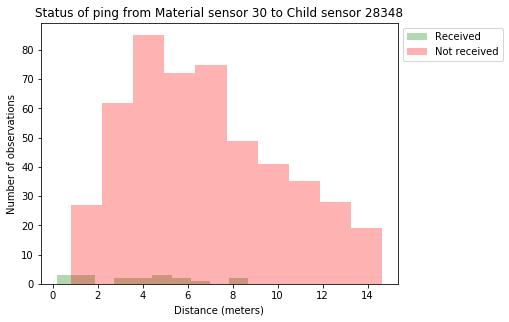

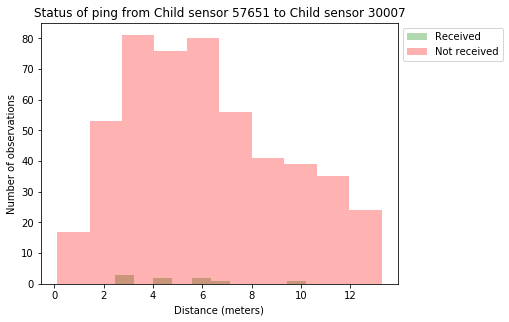

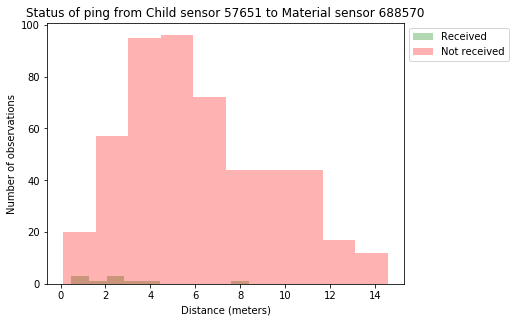

In [79]:
for y_discrete_var_index in np.random.choice(range(variable_structure.num_y_discrete_vars), size=10):
    plt.hist(
        distances_t_sim[y_discrete_t_sim[:,y_discrete_var_index] == 0, y_discrete_var_index],
        color='green',
        alpha=0.3,
        label=variable_structure.ping_status_names[0])
    plt.hist(
        distances_t_sim[y_discrete_t_sim[:,y_discrete_var_index] == 1, y_discrete_var_index],
        color='red',
        alpha=0.3,
        label=variable_structure.ping_status_names[1])
    plt.title(variable_structure.y_discrete_names[y_discrete_var_index])
    plt.xlabel('Distance (meters)')
    plt.ylabel('Number of observations')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

For 10 randomly chosen pairs of sensors, plot the (simulated) measured RSSI of the received pings versus the (simulated) distances between the sensors. We should see a wide range of RSSI readings at each distance, but with a mean value that falls off with distance and a hard cut-off at -96 dB.

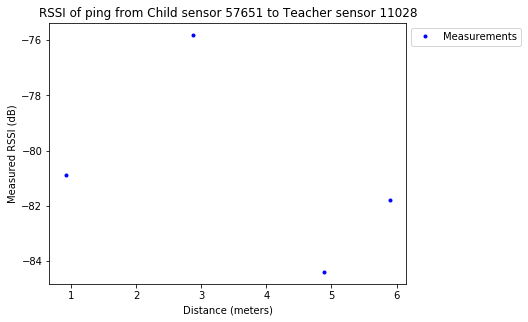

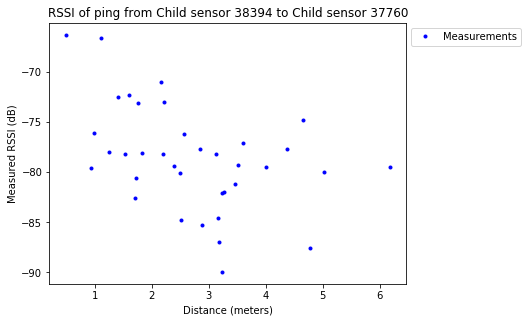

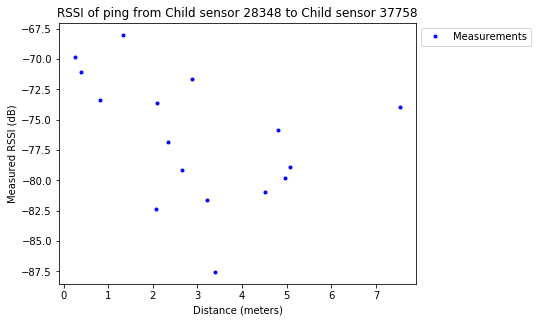

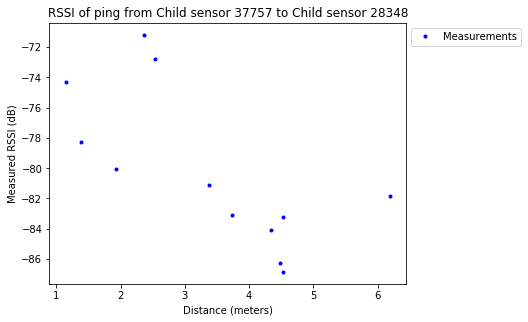

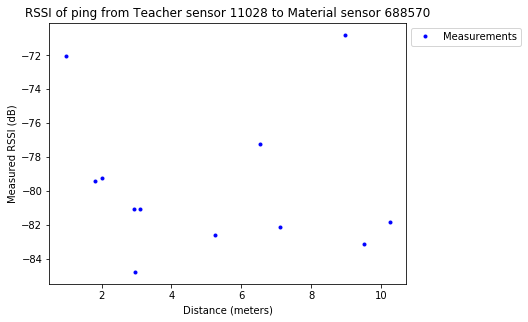

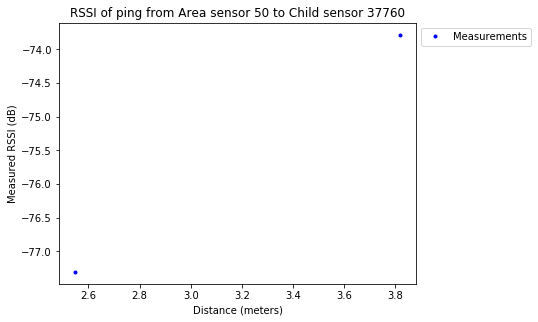

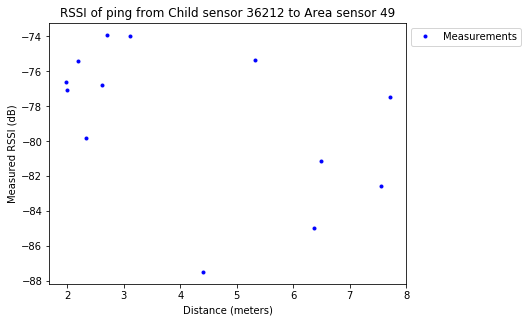

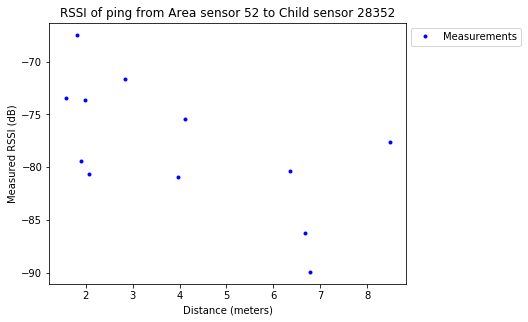

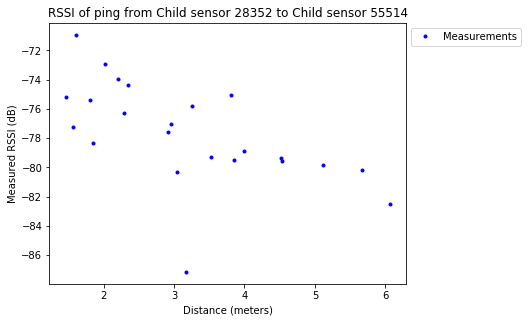

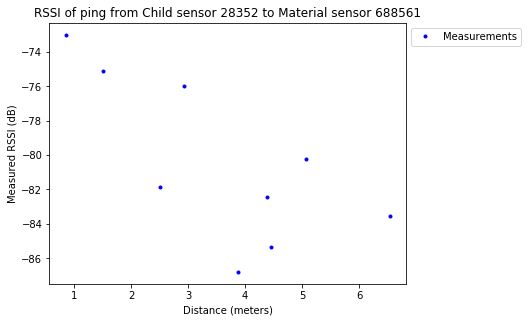

In [80]:
for y_continuous_var_index in np.random.choice(range(variable_structure.num_y_continuous_vars), size=10):
    plt.plot(
        distances_t_sim[y_discrete_t_sim[:,y_continuous_var_index] == 0, y_continuous_var_index],
        y_continuous_t_sim[y_discrete_t_sim[:,y_continuous_var_index] == 0, y_continuous_var_index],
        'b.',
        label='Measurements')
    plt.title(variable_structure.y_continuous_names[y_continuous_var_index])
    plt.xlabel('Distance (meters)')
    plt.ylabel('Measured RSSI (dB)')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

Plot particle filter diagnostics.

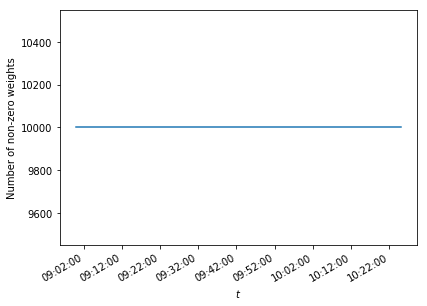

In [81]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
plt.plot(t_sim, num_nonzero_weights_sim)
plt.gcf().autofmt_xdate()
plt.xlabel('$t$')
plt.ylabel('Number of non-zero weights')
plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

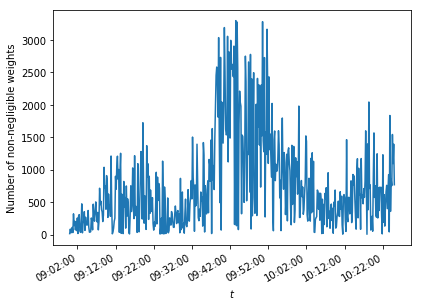

In [82]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
plt.plot(t_sim, num_nonnegligible_weights_sim)
plt.gcf().autofmt_xdate()
plt.xlabel('$t$')
plt.ylabel('Number of non-negligible weights')
plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

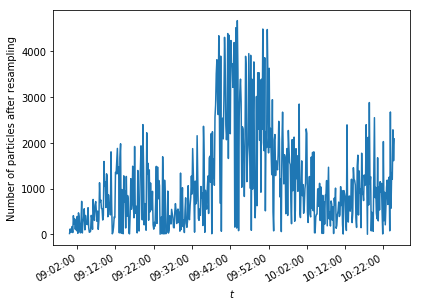

In [83]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
plt.plot(t_sim[:-1], num_after_resampling_sim)
plt.gcf().autofmt_xdate()
plt.xlabel('$t$')
plt.ylabel('Number of particles after resampling')
plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

Plot the sample means of the particles against the (simulated) actual values of $\mathbf{X}_t$.

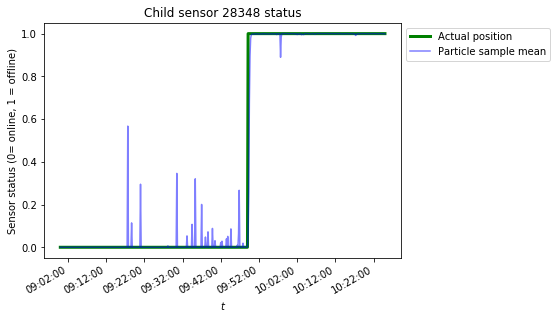

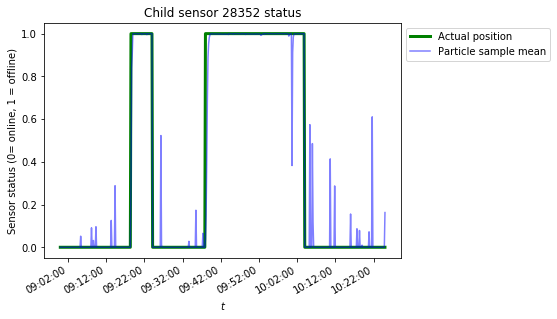

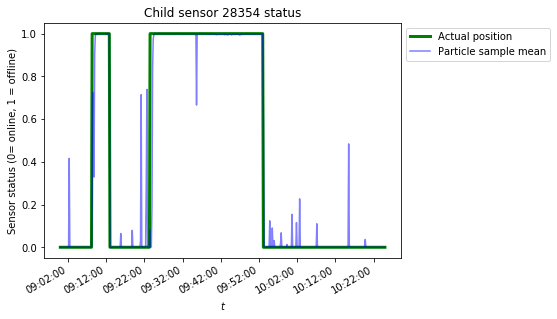

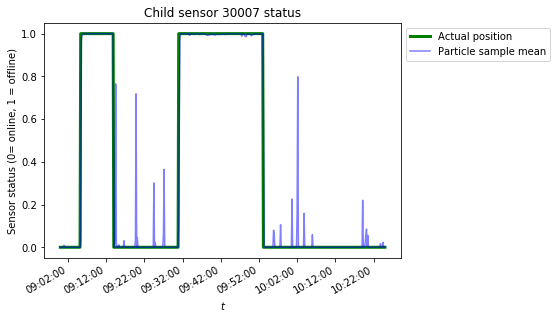

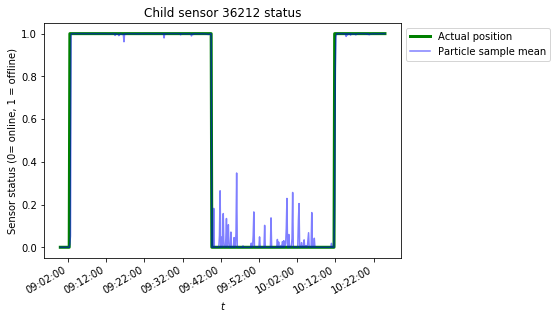

...

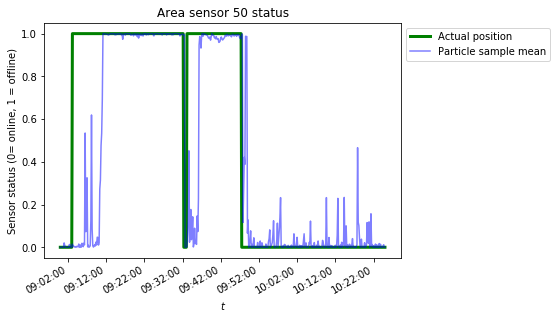

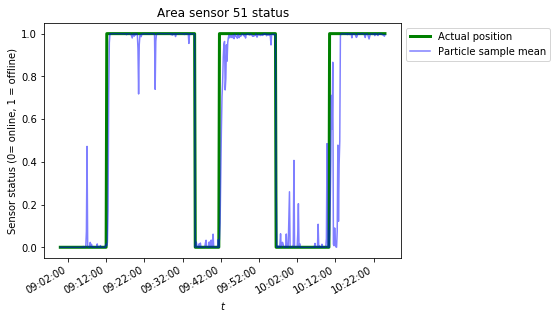

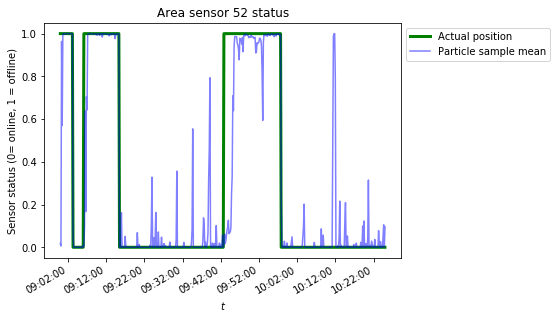

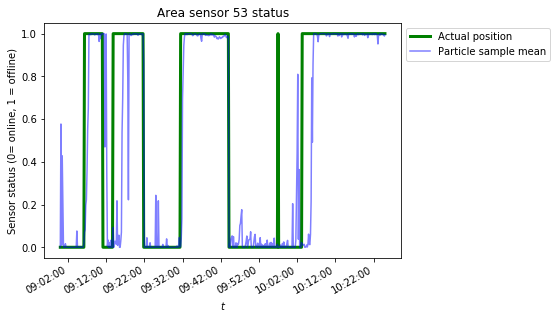

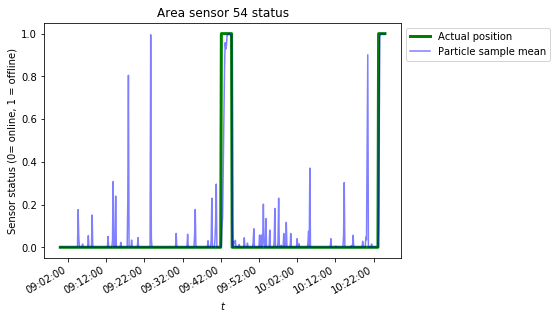

In [84]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_discrete_vars):
    plt.plot(
        t_sim,
        x_discrete_t_sim[:,x_var_index],
        'g-',
        linewidth=3.0,
        label='Actual position')
    plt.plot(
        t_sim,
        x_discrete_mean_particle_sim[:,x_var_index],
        'b-',
        alpha=0.5,
        label='Particle sample mean')
    plt.gcf().autofmt_xdate()
    plt.ylim(-0.05, 1.05)
    plt.xlabel('$t$')
    plt.ylabel('Sensor status (0= online, 1 = offline)')
    plt.title(variable_structure.x_discrete_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

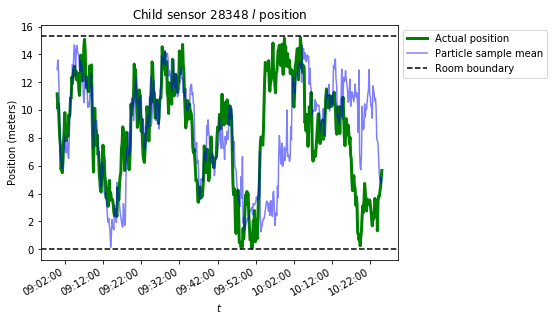

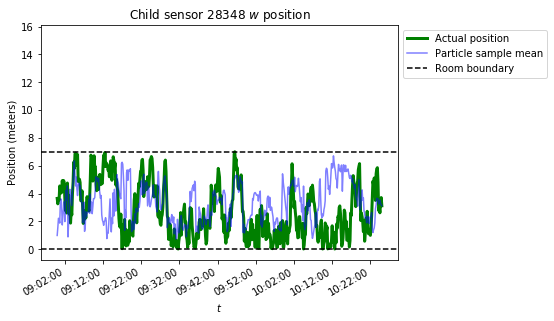

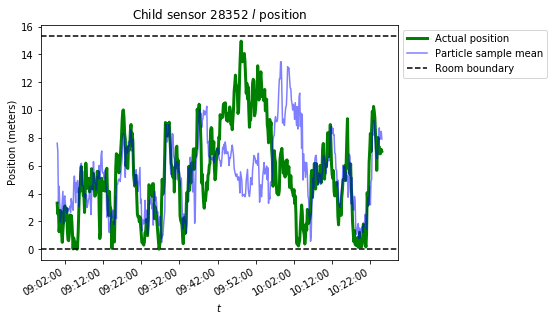

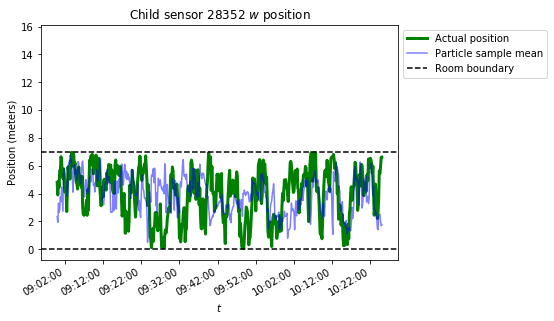

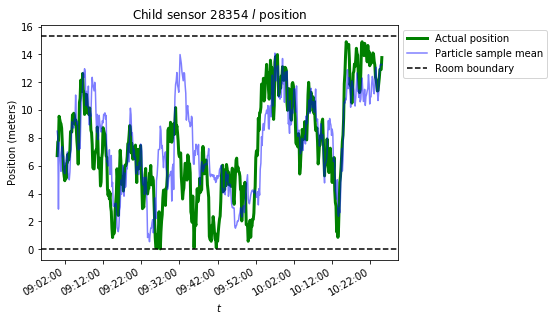

...

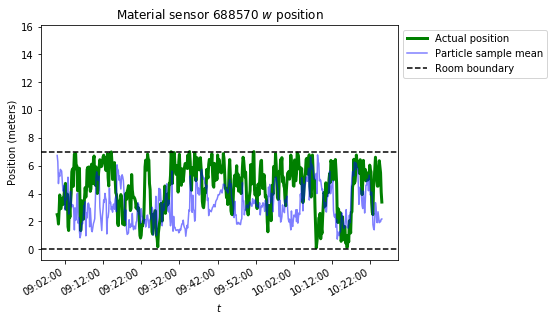

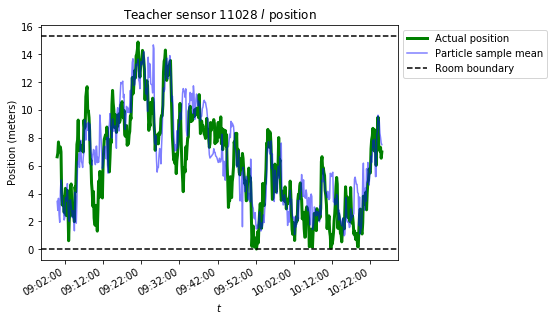

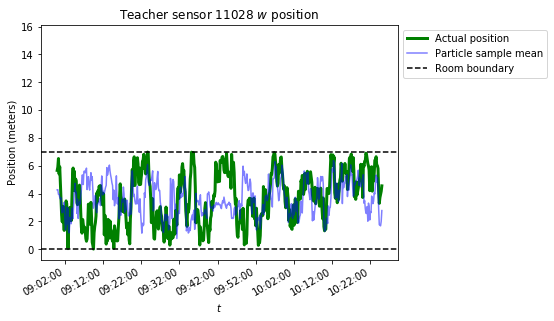

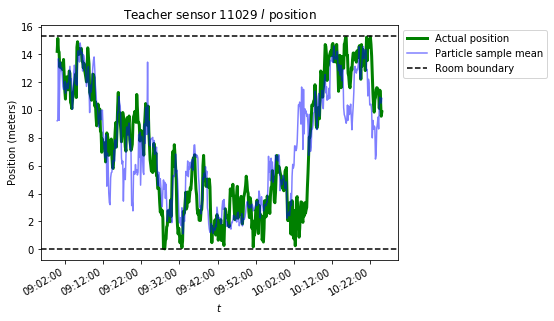

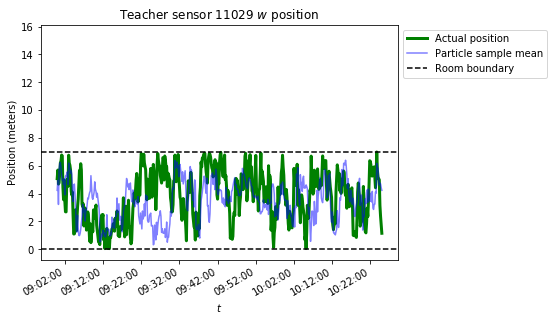

In [85]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.plot(
        t_sim,
        x_continuous_t_sim[:,x_var_index],
        'g-',
        linewidth=3.0,
        label='Actual position')
    plt.plot(
        t_sim,
        x_continuous_mean_particle_sim[:,x_var_index],
        'b-',
        alpha=0.5,
        label='Particle sample mean')
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(0 - 0.05*np.max(room_size),
             np.max(room_size) + 0.05*np.max(room_size))
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

Plot the sample confidence regions of the particles (i.e., sample means plus/minus sample standard deviations) against the (simulated) actual values of $\mathbf{X}_t$.

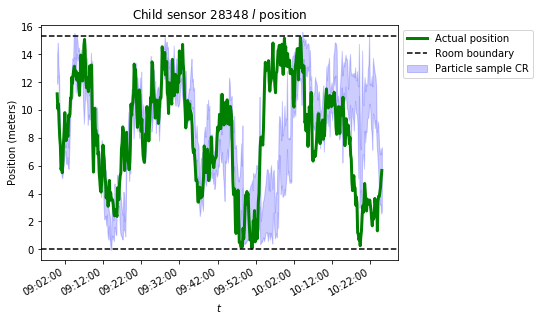

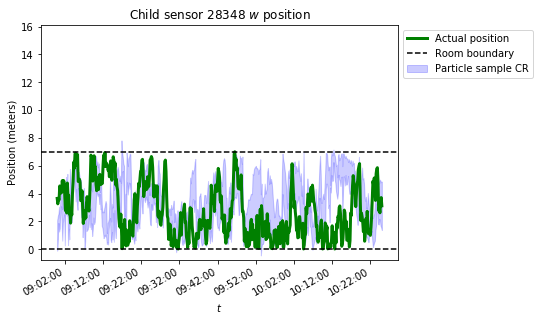

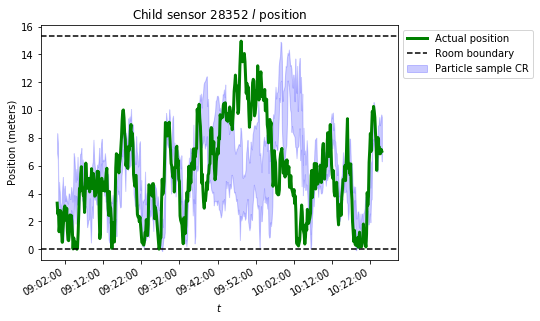

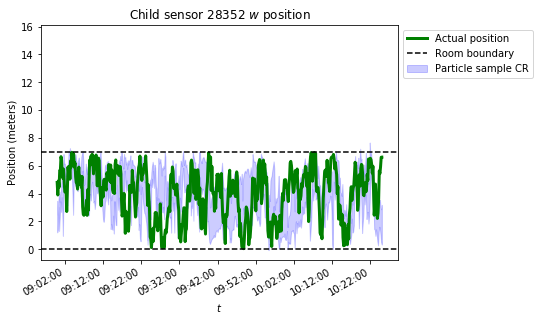

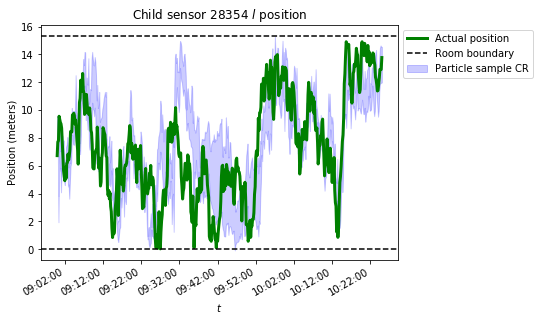

...

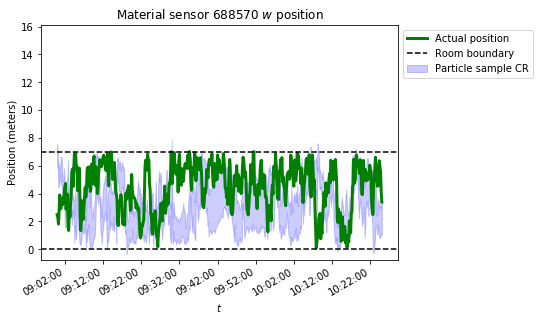

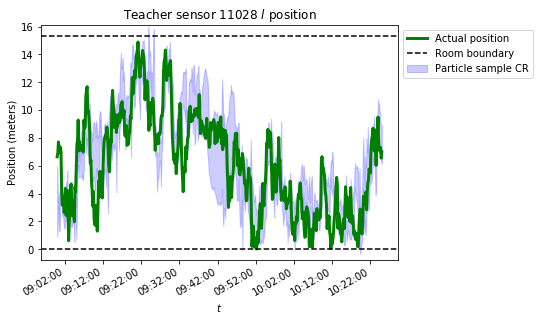

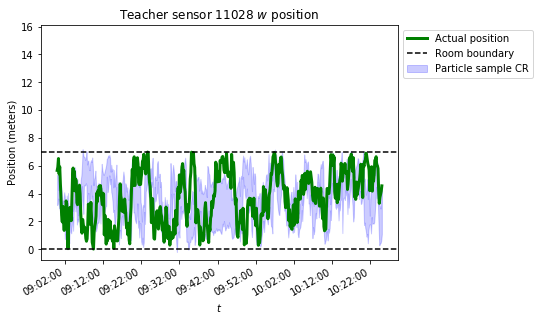

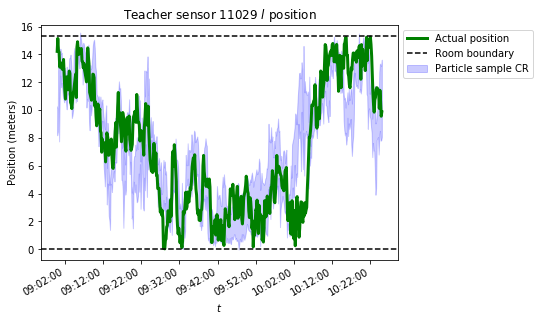

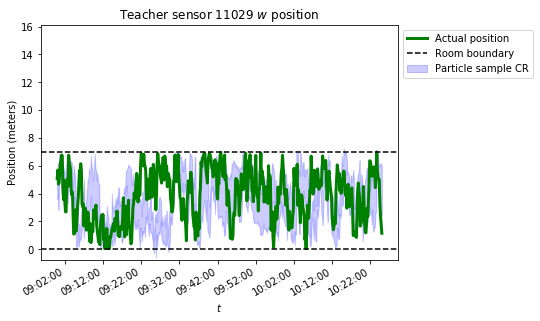

In [86]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.plot(
        t_sim,
        x_continuous_t_sim[:,x_var_index],
        'g-',
        linewidth=3.0,
        label='Actual position')
    plt.fill_between(
        t_sim,
        x_continuous_mean_particle_sim[:,x_var_index] - x_continuous_sd_particle_sim[:, x_var_index],
        x_continuous_mean_particle_sim[:,x_var_index] + x_continuous_sd_particle_sim[:, x_var_index],
        color='blue',
        alpha=0.2,
        label='Particle sample CR'
    )
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(0 - 0.05*np.max(room_size),
             np.max(room_size) + 0.05*np.max(room_size))
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

## Check that the shapes of the outputs are what we expect

In [87]:
x_discrete_first_test, x_continuous_first_test = sensor_model.x_initial_sample_test(
    num_particles) 

In [88]:
x_discrete_first_test.shape

(10000, 26)

In [89]:
x_continuous_first_test.shape

(10000, 34)

In [90]:
x_discrete_second_test, x_continuous_second_test = sensor_model.x_bar_x_previous_sample_test(
    x_discrete_first_test,
    x_continuous_first_test,
    np.timedelta64(10, 's'))

In [91]:
x_discrete_second_test.shape

(10000, 26)

In [92]:
x_continuous_second_test.shape

(10000, 34)

In [93]:
x_discrete_third_test, x_continuous_third_test = sensor_model.x_bar_x_previous_sample_test(
    x_discrete_second_test,
    x_continuous_second_test,
    np.timedelta64(10, 's'))

In [94]:
x_discrete_third_test.shape

(10000, 26)

In [95]:
x_continuous_third_test.shape

(10000, 34)

In [96]:
y_discrete_first_test, y_continuous_first_test = sensor_model.y_bar_x_sample_test(
    x_discrete_first_test,
    x_continuous_first_test)

In [97]:
y_discrete_first_test.shape

(10000, 492)

In [98]:
y_continuous_first_test.shape

(10000, 492)

In [99]:
log_pdf_test = sensor_model.y_bar_x_log_pdf_test(
    x_discrete_first_test,
    x_continuous_first_test,
    y_discrete_first_test,
    y_continuous_first_test)

In [100]:
log_pdf_test.shape

(10000,)

In [101]:
distances_test = sensor_model.distances_test(x_continuous_first_test)

In [102]:
distances_test.shape

(10000, 492)

In [103]:
ping_success_probabilities_from_distances_test = sensor_model.ping_success_probabilities_from_distances_test(distances_test)

In [104]:
ping_success_probabilities_from_distances_test.shape

(10000, 492)

In [105]:
rssi_untruncated_mean_test = sensor_model.rssi_untruncated_mean_test(distances_test)

In [106]:
rssi_untruncated_mean_test.shape

(10000, 492)

In [107]:
x_discrete_first_single_test, x_continuous_first_single_test = sensor_model.x_initial_sample_test(
    1) 

In [108]:
x_discrete_first_single_test.shape

(26,)

In [109]:
x_continuous_first_single_test.shape

(34,)

In [110]:
x_discrete_second_single_test, x_continuous_second_single_test = sensor_model.x_bar_x_previous_sample_test(
    x_discrete_first_single_test,
    x_continuous_first_single_test,
    np.timedelta64(10, 's'))

In [111]:
x_discrete_second_single_test.shape

(26,)

In [112]:
x_continuous_second_single_test.shape

(34,)

In [113]:
x_discrete_third_single_test, x_continuous_third_single_test = sensor_model.x_bar_x_previous_sample_test(
    x_discrete_second_single_test,
    x_continuous_second_single_test,
    np.timedelta64(10, 's'))

In [114]:
x_discrete_third_single_test.shape

(26,)

In [115]:
x_continuous_third_single_test.shape

(34,)

In [116]:
y_discrete_first_single_test, y_continuous_first_single_test = sensor_model.y_bar_x_sample_test(
    x_discrete_first_single_test,
    x_continuous_first_single_test)

In [117]:
y_discrete_first_single_test.shape

(492,)

In [118]:
y_continuous_first_single_test.shape

(492,)

In [119]:
log_pdf_single_test = sensor_model.y_bar_x_log_pdf_test(
    x_discrete_first_single_test,
    x_continuous_first_single_test,
    y_discrete_first_single_test,
    y_continuous_first_single_test)

In [120]:
log_pdf_single_test.shape

()

In [121]:
distances_single_test = sensor_model.distances_test(
    x_continuous_first_single_test)

In [122]:
distances_single_test.shape

(492,)

In [123]:
ping_success_probabilities_from_distances_single_test = sensor_model.ping_success_probabilities_from_distances_test(
    distances_single_test)

In [124]:
ping_success_probabilities_from_distances_single_test.shape

(492,)

In [125]:
rssi_untruncated_mean_single_test = sensor_model.rssi_untruncated_mean_test(
    distances_single_test)

In [126]:
rssi_untruncated_mean_single_test.shape

(492,)

In [127]:
x_discrete_particles_first_test, x_continuous_particles_first_test, log_weights_first_test = sensor_model.generate_initial_particles(
    y_discrete_t[0],
    y_continuous_t[0])

In [128]:
x_discrete_particles_first_test.shape

(10000, 26)

In [129]:
x_continuous_particles_first_test.shape

(10000, 34)

In [130]:
log_weights_first_test.shape

(10000,)

In [131]:
x_discrete_particles_second_test, x_continuous_particles_second_test, log_weights_second_test, ancestor_indices_second_test = sensor_model.generate_next_particles(
    x_discrete_particles_first_test,
    x_continuous_particles_first_test,
    log_weights_first_test,
    y_discrete_t[1],
    y_discrete_t[1],
    np.timedelta64(10, 's'))

In [132]:
x_discrete_particles_second_test.shape

(10000, 26)

In [133]:
x_continuous_particles_second_test.shape

(10000, 34)

In [134]:
log_weights_second_test.shape

(10000,)

In [135]:
ancestor_indices_second_test.shape

(10000,)

In [136]:
x_discrete_particles_third_test, x_continuous_particles_third_test, log_weights_third_test, ancestor_indices_third_test = sensor_model.generate_next_particles(
    x_discrete_particles_second_test,
    x_continuous_particles_second_test,
    log_weights_second_test,
    y_discrete_t[2],
    y_discrete_t[2],
    np.timedelta64(10, 's'))

In [137]:
x_discrete_particles_third_test.shape

(10000, 26)

In [138]:
x_continuous_particles_third_test.shape

(10000, 34)

In [139]:
log_weights_third_test.shape

(10000,)

In [140]:
ancestor_indices_third_test.shape

(10000,)

In [141]:
x_discrete_sim_first_test, x_continuous_sim_first_test, y_discrete_sim_first_test, y_continuous_sim_first_test = sensor_model.generate_initial_simulation_timestep()

In [142]:
x_discrete_sim_first_test.shape

(26,)

In [143]:
x_continuous_sim_first_test.shape

(34,)

In [144]:
y_discrete_sim_first_test.shape

(492,)

In [145]:
y_continuous_sim_first_test.shape

(492,)

In [146]:
x_discrete_sim_second_test, x_continuous_sim_second_test, y_discrete_sim_second_test, y_continuous_sim_second_test = sensor_model.generate_next_simulation_timestep(
    x_discrete_sim_first_test,
    x_continuous_sim_first_test,
    np.timedelta64(10, 's'))

In [147]:
x_discrete_sim_second_test.shape

(26,)

In [148]:
x_continuous_sim_second_test.shape

(34,)

In [149]:
y_discrete_sim_second_test.shape

(492,)

In [150]:
y_continuous_sim_second_test.shape

(492,)

In [151]:
x_discrete_sim_third_test, x_continuous_sim_third_test, y_discrete_sim_third_test, y_continuous_sim_third_test = sensor_model.generate_next_simulation_timestep(
    x_discrete_sim_second_test,
    x_continuous_sim_second_test,
    np.timedelta64(10, 's'))

In [152]:
x_discrete_sim_third_test.shape

(26,)

In [153]:
x_continuous_sim_third_test.shape

(34,)

In [154]:
y_discrete_sim_third_test.shape

(492,)

In [155]:
y_continuous_sim_third_test.shape

(492,)

In [156]:
sensor_model_single = SensorModel(
    variable_structure,
    room_corners,
    fixed_sensor_positions,
    1)

In [157]:
x_discrete_particles_first_single_test, x_continuous_particles_first_single_test, log_weights_first_single_test = sensor_model_single.generate_initial_particles(y_discrete_t[0], y_continuous_t[0])

In [158]:
x_discrete_particles_first_single_test.shape

(1, 26)

In [159]:
x_continuous_particles_first_single_test.shape

(1, 34)

In [160]:
log_weights_first_single_test.shape

(1,)

In [161]:
x_discrete_particles_second_single_test, x_continuous_particles_second_single_test, log_weights_second_single_test, ancestor_indices_second_single_test = sensor_model_single.generate_next_particles(
    x_discrete_particles_first_single_test,
    x_continuous_particles_first_single_test,
    log_weights_first_single_test,
    y_discrete_t[1],
    y_discrete_t[1],
    np.timedelta64(10, 's'))

In [162]:
x_discrete_particles_second_single_test.shape

(1, 26)

In [163]:
x_continuous_particles_second_single_test.shape

(1, 34)

In [164]:
log_weights_second_single_test.shape

(1,)

In [165]:
ancestor_indices_second_single_test.shape

(1,)

In [166]:
x_discrete_particles_third_single_test, x_continuous_particles_third_single_test, log_weights_third_single_test, ancestor_indices_third_single_test = sensor_model_single.generate_next_particles(
    x_discrete_particles_second_single_test,
    x_continuous_particles_second_single_test,
    log_weights_second_single_test,
    y_discrete_t[2],
    y_discrete_t[2],
    np.timedelta64(10, 's'))

In [167]:
x_discrete_particles_third_single_test.shape

(1, 26)

In [168]:
x_continuous_particles_third_single_test.shape

(1, 34)

In [169]:
log_weights_third_single_test.shape

(1,)

In [170]:
ancestor_indices_third_single_test.shape

(1,)

## Analyze number of pings received and sent by each sensor

In [171]:
data_numpy_filename = 'ping_data_all_sensors'

In [172]:
ping_data = np.load(
    os.path.join(
        data_path,
        data_run_directory,
        'numpy/ping_data_all_sensors.npz'))

In [173]:
y_discrete_all_sensors_t = ping_data['y_discrete_all_sensors_t']
y_continuous_all_sensors_t = ping_data['y_continuous_all_sensors_t']

In [174]:
num_pings_sent = np.sum(y_discrete_all_sensors_t == 0, axis=-1)

In [175]:
num_pings_received = np.sum(y_discrete_all_sensors_t == 0, axis=-2)

In [176]:
np.bincount(num_pings_received[0])

array([3, 5, 4, 9, 5], dtype=int64)

In [177]:
np.bincount(num_pings_received[10])

array([ 4,  3,  1, 14,  3,  1], dtype=int64)

In [178]:
np.bincount(num_pings_received[20])

array([4, 3, 1, 3, 7, 8], dtype=int64)

In [179]:
np.bincount(num_pings_sent[0])

array([12,  3,  2,  2,  3,  1,  0,  1,  0,  0,  1,  0,  0,  1],
      dtype=int64)

In [180]:
np.bincount(num_pings_sent[10])

array([11,  2,  3,  2,  2,  3,  0,  1,  0,  1,  0,  1], dtype=int64)

In [181]:
np.bincount(num_pings_sent[20])

array([9, 5, 1, 0, 1, 1, 3, 2, 3, 0, 1], dtype=int64)

In [182]:
variable_structure.child_entity_ids

array([28348, 28352, 28354, 30007, 36212, 37757, 37758, 37760, 38394,
       55514, 57651])

In [183]:
variable_structure.material_entity_ids

array([    30, 688554, 688561, 688570])

In [184]:
variable_structure.teacher_entity_ids

array([11028, 11029])

In [185]:
variable_structure.area_entity_ids

array([29, 31, 36, 49, 50, 51, 52, 53, 54])

In [186]:
variable_structure.num_sensors

26

In [187]:
y_discrete_all_sensors_t.shape

(511, 26, 26)

In [188]:
pd.DataFrame(np.sum(y_discrete_all_sensors_t == 0, axis=0)).to_csv('./output/aster_180313/csv/ping_count.csv', index=False)

## Load the ground truth data for moving sensor positions

In [189]:
data_numpy_filename = 'moving_sensor_data'

In [190]:
moving_sensor_data = np.load(
    os.path.join(
        data_path,
        data_run_directory,
        'numpy/moving_sensor_data.npz'))

In [191]:
x_continuous_t_ground_truth = moving_sensor_data['x_continuous_t']

## Infer the ground truth data for sensor status

In [192]:
x_discrete_t_ground_truth = np.logical_and(num_pings_received == 0, num_pings_sent == 0).astype('int')

## Analyze sensor response vs. ground truth data

In [193]:
distances_t_ground_truth = sensor_model.distances_test(x_continuous_t_ground_truth)

In [194]:
distances_t_ground_truth[10]

array([0.08029135, 4.627297  , 2.6100307 , 0.26361194, 4.6512184 ,
       2.7107682 , 2.5706549 , 4.603332  , 0.24998912, 4.486044  ,
              nan,        nan,        nan,        nan, 4.6295743 ,
       4.620901  , 1.5751776 , 8.02791   , 7.904393  , 3.0432858 ,
       4.71889   , 5.4930663 , 5.877902  , 4.66798   , 2.8026743 ,
       0.08029135, 4.554294  , 2.55983   , 0.18789388, 4.5779448 ,
       2.6654747 , 2.5216274 , 4.5301757 , 0.17200345, 4.4139476 ,
              nan,        nan,        nan,        nan, 4.585968  ,
       4.5764546 , 1.6532986 , 7.965729  , 7.863799  , 2.965801  ,
       4.768011  , 5.4457397 , 5.846269  , 4.658276  , 2.763445  ,
       4.627297  , 4.554294  , 4.68765   , 4.430704  , 0.04455592,
       4.9116006 , 4.7206154 , 0.0320568 , 4.426861  , 0.18435735,
              nan,        nan,        nan,        nan, 2.5742207 ,
       2.5164227 , 6.181968  , 3.739765  , 4.894621  , 1.6991946 ,
       9.063212  , 6.4002724 , 3.9450917 , 4.518951  , 5.17189

In [195]:
ping_success_probabilities_t_ground_truth, ping_failure_probabilities_t_ground_truth = sensor_model.ping_success_probabilities_test(
    x_discrete_t_ground_truth,
    distances_t_ground_truth)

In [196]:
rssi_untruncated_mean_t_ground_truth = sensor_model.rssi_untruncated_mean_test(
    distances_t_ground_truth)

In [197]:
distances_flattened = distances_t_ground_truth[
    np.logical_and(
        y_discrete_t == 0,
        np.isfinite(distances_t_ground_truth))]

In [198]:
log_10_distances_flattened = np.log10(distances_flattened)

In [199]:
rssi_untruncated_means_flattened = rssi_untruncated_mean_t_ground_truth[
    np.logical_and(
        y_discrete_t == 0,
        np.isfinite(distances_t_ground_truth))]

In [200]:
rssi_observed_flattened = y_continuous_t[
    np.logical_and(
        y_discrete_t == 0,
        np.isfinite(distances_t_ground_truth))]

In [201]:
rssi_model = linear_model.LinearRegression()
rssi_model.fit(np.reshape(log_10_distances_flattened, (-1, 1)),rssi_observed_flattened)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [202]:
rssi_model.coef_

array([-9.803633], dtype=float32)

In [203]:
rssi_model.intercept_

-74.188644

In [204]:
rssi_fit_flattened = rssi_model.predict(np.reshape(log_10_distances_flattened, (-1, 1)))

In [205]:
errors = rssi_fit_flattened - rssi_observed_flattened

In [206]:
np.std(errors)

4.508689116013947

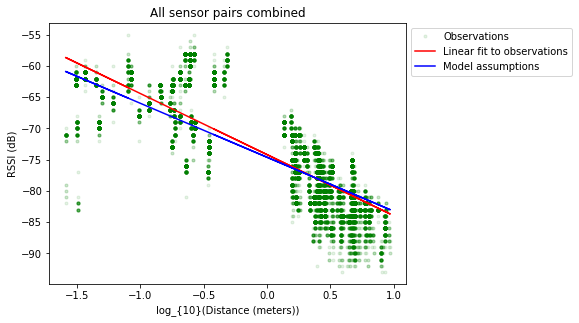

In [207]:
plt.plot(
    log_10_distances_flattened,
    rssi_observed_flattened,
    'g.',
    alpha=0.1,
    label='Observations')
plt.plot(
    log_10_distances_flattened,
    rssi_fit_flattened,
    'r-',
    label='Linear fit to observations')
plt.plot(
    log_10_distances_flattened,
    rssi_untruncated_means_flattened,
    'b-',
    label='Model assumptions')
plt.xlabel('log_{10}(Distance (meters))')
plt.ylabel('RSSI (dB)')
plt.title('All sensor pairs combined')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [208]:
sensors_online = variable_structure.extract_y_variables(
    np.logical_and(
        np.expand_dims(x_discrete_t_ground_truth == 0, -1),
        np.expand_dims(x_discrete_t_ground_truth == 0, -2)))

In [209]:
ping_success_data = pd.DataFrame({
    'distances': distances_t_ground_truth[np.logical_and(
        sensors_online,
        np.isfinite(distances_t_ground_truth))],
    'model_probabilities': ping_success_probabilities_t_ground_truth[np.logical_and(
        sensors_online,
        np.isfinite(distances_t_ground_truth))],
    'observations': y_discrete_t[np.logical_and(
        sensors_online,
        np.isfinite(distances_t_ground_truth))] == 0
})

In [210]:
ping_success_data['distance_decile'] = pd.qcut(ping_success_data['distances'], 10)

In [211]:
ping_success_rate_data = ping_success_data.groupby('distance_decile', as_index=False).agg({
    'distances': np.mean,
    'model_probabilities': np.mean,
    'observations': np.mean})

In [212]:
ping_success_rate_data

,distance_decile,distances,model_probabilities,observations
0,"(0.0249, 0.456]",0.176151,0.524594,0.652855
1,"(0.456, 2.455]",1.968686,0.247410,0.393679
2,"(2.455, 2.837]",2.609308,0.185802,0.187791
3,"(2.837, 3.829]",3.330622,0.137858,0.116312
4,"(3.829, 4.542]",4.304253,0.090509,0.031511
5,"(4.542, 4.722]",4.635391,0.078234,0.098381
6,"(4.722, 4.932]",4.817765,0.072386,0.092610
7,"(4.932, 6.04]",5.601000,0.052433,0.047415
8,"(6.04, 7.742]",6.626522,0.034203,0.024586
9,"(7.742, 9.432]",8.604117,0.014807,0.023124


In [213]:
ping_success_model = linear_model.LinearRegression()
ping_success_model.fit(
    np.reshape(ping_success_rate_data['distances'].values, (-1, 1)),
    np.reshape(np.log(ping_success_rate_data['observations'].values), (-1, 1)))

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [214]:
ping_success_zero_distance_fit = np.squeeze(np.exp(ping_success_model.intercept_))

In [215]:
scale_factor_fit = np.squeeze(1/ping_success_model.coef_)

In [216]:
ping_success_zero_distance_fit

array(0.5904653, dtype=float32)

In [217]:
scale_factor_fit

array(-2.2953947, dtype=float32)

In [218]:
sensor_model.ping_success_probability_zero_distance

0.5655

In [219]:
sensor_model.scale_factor

-2.34429701772962

In [220]:
ping_success_probability_reference_distance_fit = ping_success_zero_distance_fit*np.exp(sensor_model.reference_distance/scale_factor_fit)

In [221]:
ping_success_probability_reference_distance_fit

0.007571275749461926

In [222]:
sensor_model.receive_probability_reference_distance

0.007941

In [223]:
distances_range = np.linspace(
    ping_success_rate_data['distances'].min(),
    ping_success_rate_data['distances'].max(),
    100)

In [224]:
ping_success_fit = ping_success_zero_distance_fit*np.exp(distances_range/scale_factor_fit)

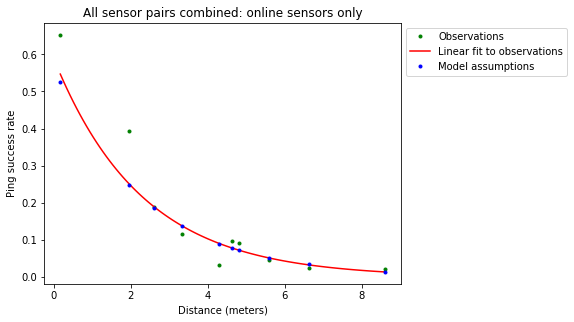

In [225]:
plt.plot(
    ping_success_rate_data['distances'],
    ping_success_rate_data['observations'],
    'g.',
    label='Observations')
plt.plot(
    distances_range,
    ping_success_fit,
    'r-',
    label='Linear fit to observations')
plt.plot(
    ping_success_rate_data['distances'],
    ping_success_rate_data['model_probabilities'],
    'b.',
    label='Model assumptions')
plt.xlabel('Distance (meters)')
plt.ylabel('Ping success rate')
plt.title('All sensor pairs combined: online sensors only')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

## Compare the model results to the ground truth data

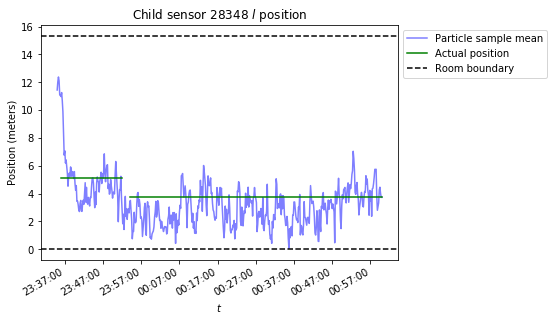

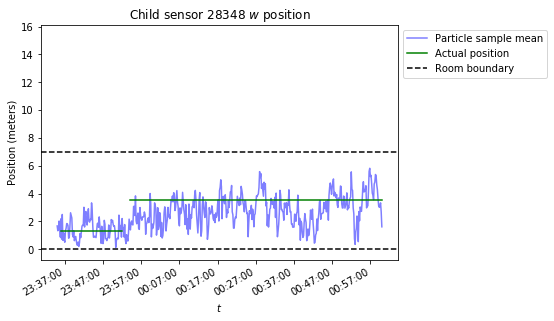

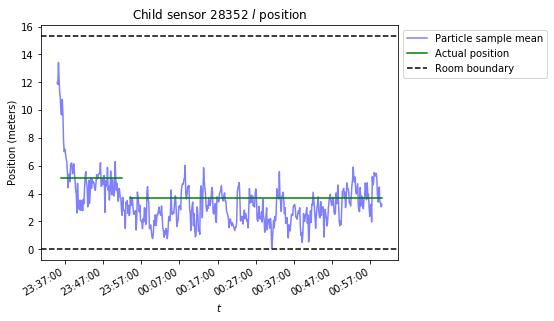

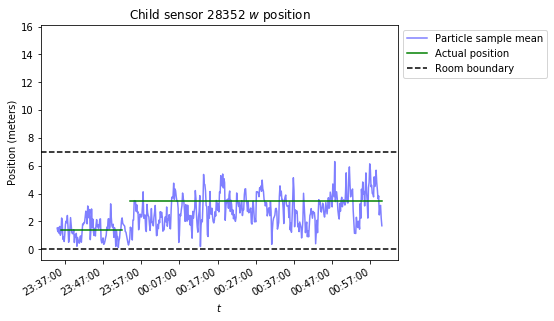

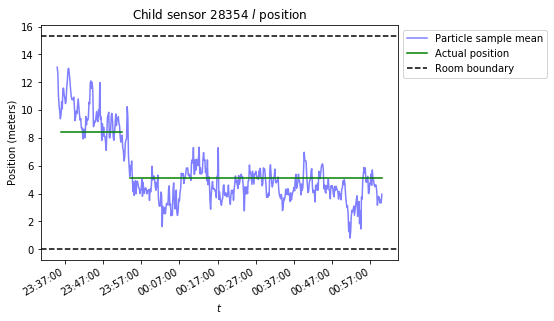

...

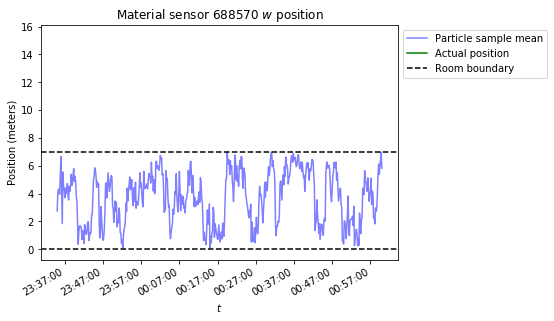

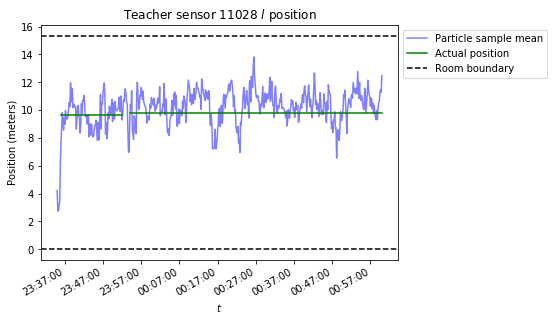

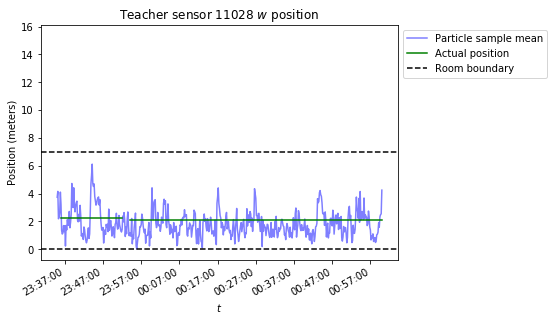

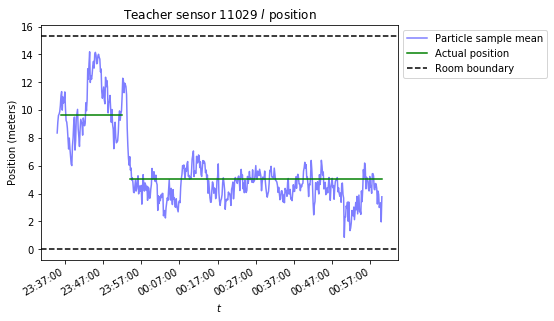

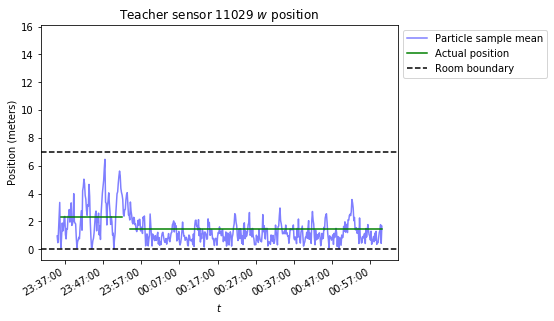

In [226]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.plot(
        t_test,
        x_continuous_mean_particle[:,x_var_index],
        'b-',
        alpha=0.5,
        label='Particle sample mean')
    plt.plot(
        t_test,
        x_continuous_t_ground_truth[:,x_var_index],
        'g-',
        alpha=1.0,
        label='Actual position')
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(
        0 - 0.05*np.max(room_size),
        np.max(room_size) + 0.05*np.max(room_size))
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]

Plot the sample confidence regions of the particles (i.e., sample means plus/minus sample standard deviations).

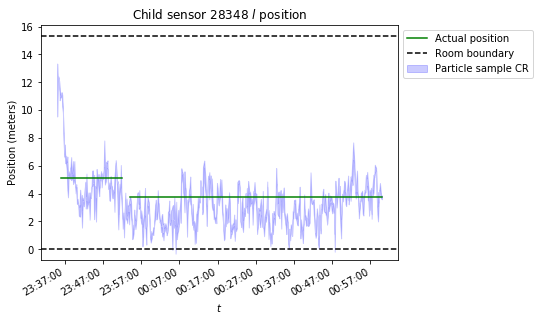

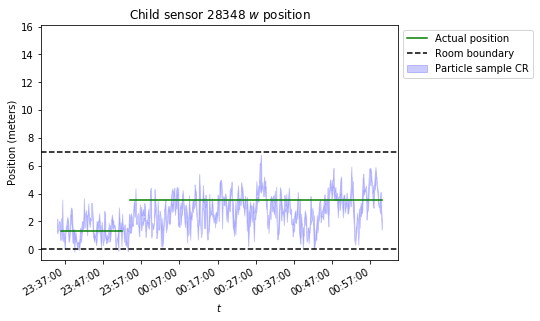

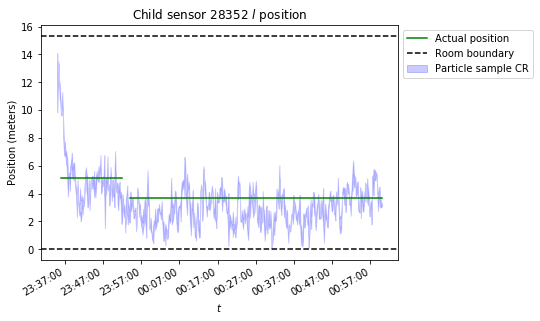

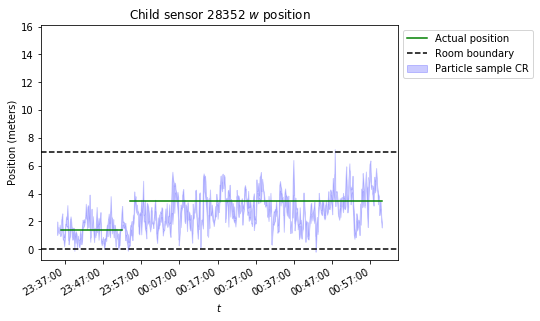

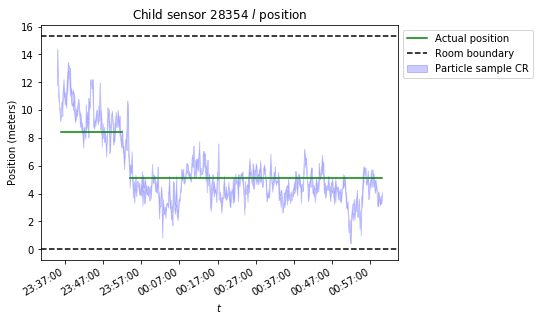

...

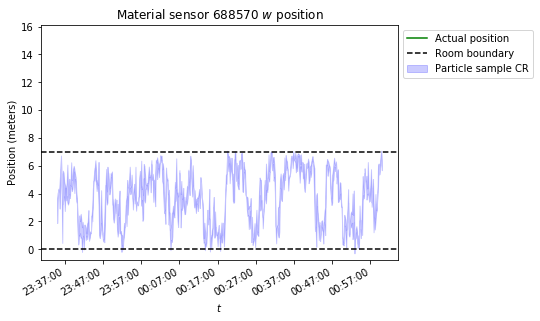

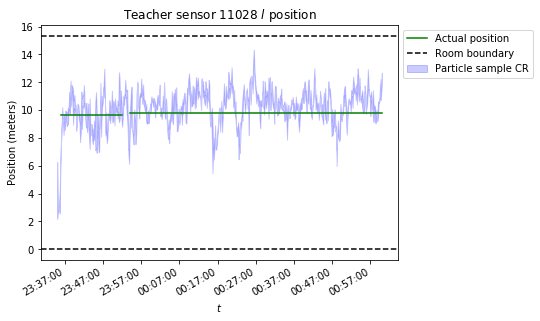

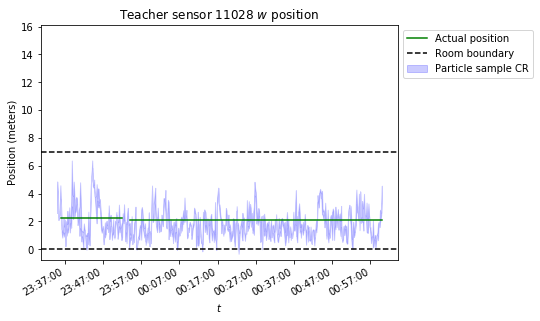

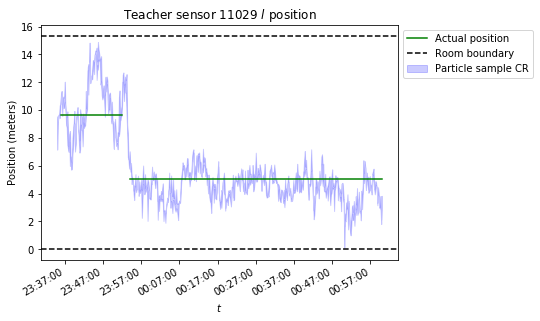

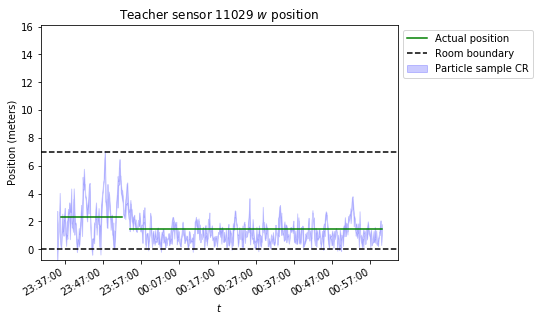

In [227]:
plt.rcParams["date.autoformatter.minute"] = "%H:%M:%S"
for x_var_index in range(variable_structure.num_x_continuous_vars):
    plt.fill_between(
        t_test,
        x_continuous_mean_particle[:,x_var_index] - x_continuous_sd_particle[:, x_var_index],
        x_continuous_mean_particle[:,x_var_index] + x_continuous_sd_particle[:, x_var_index],
        color='blue',
        alpha=0.2,
        label='Particle sample CR'
    )
    plt.plot(
        t_test,
        x_continuous_t_ground_truth[:,x_var_index],
        'g-',
        alpha=1.0,
        label='Actual position')
    plt.gcf().autofmt_xdate()
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.ylim(
        0 - 0.05*np.max(room_size),
        np.max(room_size) + 0.05*np.max(room_size))
    plt.xlabel('$t$')
    plt.ylabel('Position (meters)')
    plt.title(variable_structure.x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()
plt.rcParams["date.autoformatter.minute"] = plt.rcParamsDefault["date.autoformatter.minute"]